In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
sales_data = pd.read_csv('SALESDATA.csv', parse_dates=['DateKey','Invoice Date', 'Promised Delivery Date'])
sales_data

,Custkey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Order Number,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M
0,10025248,2017-05-23,340.8400,2017-05-23,100080,P01,61762,Carlson Blueberry Yogurt,2000,803.8600,200086,2017-05-23,463.02,803.8600,0.00,463.02,463.020,1,145,EA
1,10025063,2017-06-02,16812.4800,2017-06-02,100093,NaN,62058,Big Time Popsicles,2000,1293.0000,200101,2017-05-29,14219.52,31032.0000,0.00,14219.52,592.480,24,162,EA
2,10025549,2017-06-02,195.3900,2017-06-02,100094,P01,24335,Kiwi Scallops,2000,217.1000,200105,2017-06-02,238.81,434.2000,0.00,238.81,119.405,2,103,EA
3,10002489,2017-06-03,-211.7500,2017-06-03,100096,P03,NaN,Kiwi Lox,1000,0.0000,200107,2017-06-03,211.75,0.0000,0.00,211.75,211.750,1,160,EA
4,10015824,2017-06-12,317.4600,2017-06-12,100130,P01,31682,Golden Waffles,15000,317.4600,200143,2017-06-12,317.46,634.9200,0.00,317.46,158.730,2,103,EA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65275,10025025,2019-05-11,1327.1200,2019-05-11,332837,P01,17801,Better Fancy Canned Sardines,4000,1431.2300,126601,2019-05-11,1535.34,2862.4600,899.38,635.96,767.670,2,110,EA
65276,10020181,2019-05-11,639.8200,2019-05-11,332840,P01,17801,Better Fancy Canned Sardines,3000,1431.2300,126609,2019-05-11,791.41,1431.2300,449.69,341.72,791.410,1,115,EA
65277,10020181,2019-05-11,1028.5798,2019-05-11,332840,P01,31875,Golden Frozen Chicken Thighs,2000,1150.4399,126609,2019-05-11,1272.30,2300.8798,640.09,632.21,636.150,2,115,EA
65278,10020181,2019-05-11,1121.3398,2019-05-11,332840,P01,37441,Atomic Mint Chocolate Bar,1000,1254.1899,126609,2019-05-11,1387.04,2508.3798,688.55,698.49,693.520,2,115,EA


In [3]:
# Checking the Shape
sales_data.shape

(65280, 20)

In [4]:
sales_data.columns

Index(['Custkey', 'DateKey', 'Discount Amount', 'Invoice Date',
       'Invoice Number', 'Item Class', 'Item Number', 'Item', 'Line Number',
       'List Price', 'Order Number', 'Promised Delivery Date', 'Sales Amount',
       'Sales Amount Based on List Price', 'Sales Cost Amount',
       'Sales Margin Amount', 'Sales Price', 'Sales Quantity', 'Sales Rep',
       'U/M'],
      dtype='object')

In [5]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65280 entries, 0 to 65279
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Custkey                           65280 non-null  int64         
 1   DateKey                           65280 non-null  datetime64[ns]
 2   Discount Amount                   65278 non-null  float64       
 3   Invoice Date                      65280 non-null  datetime64[ns]
 4   Invoice Number                    65280 non-null  int64         
 5   Item Class                        56995 non-null  object        
 6   Item Number                       65240 non-null  object        
 7   Item                              65280 non-null  object        
 8   Line Number                       65280 non-null  int64         
 9   List Price                        65280 non-null  float64       
 10  Order Number                      65280 non-nu

In [6]:
# Checking no. of Null Values
sales_data.isnull().sum()

Custkey                                0
DateKey                                0
Discount Amount                        2
Invoice Date                           0
Invoice Number                         0
Item Class                          8285
Item Number                           40
Item                                   0
Line Number                            0
List Price                             0
Order Number                           0
Promised Delivery Date                 0
Sales Amount                           0
Sales Amount Based on List Price       0
Sales Cost Amount                      0
Sales Margin Amount                    0
Sales Price                            1
Sales Quantity                         0
Sales Rep                              0
U/M                                    0
dtype: int64

In [9]:
sales_data01 = sales_data.copy()

In [8]:
sales_data01['Item Class'].value_counts()

P01    56965
PO1       16
P03        1
P15        1
P06        1
P12        1
P13        1
P04        1
P05        1
P14        1
P11        1
P08        1
P07        1
P10        1
P09        1
P02        1
Name: Item Class, dtype: int64

In [10]:
# Removing Null Values
sales_data01.dropna(subset=['Discount Amount','Sales Price', 'Item Number'],inplace=True)

In [11]:
# Generating descriptive statistics
sales_data01.describe()

,Custkey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
count,6.524000e+04,65240.000000,65240.000000,65240.000000,65240.000000,65240.000000,65240.000000,65240.000000,65240.000000,65240.000000,65240.000000,65240.000000,65240.000000
mean,1.001770e+07,1857.332863,216294.567259,23725.376180,515.021356,180567.311695,2853.161197,4710.494059,1662.048528,1191.112669,283.253429,45.107357,137.421735
std,7.175892e+03,9039.603327,94981.656013,32669.704672,449.146853,67612.713894,15169.133687,20702.762126,9559.467966,5862.610381,250.449245,429.796995,26.644355
min,1.000045e+07,-255820.800000,100080.000000,1000.000000,0.000000,100838.000000,200.010000,0.000000,0.000000,-3932.930000,0.337341,1.000000,103.000000
25%,1.001272e+07,246.280000,117969.750000,3000.000000,181.560000,115281.000000,308.362500,561.040000,167.810000,129.890000,100.030000,2.000000,113.000000
50%,1.001966e+07,442.205000,222906.000000,12000.000000,325.190000,203695.000000,553.940000,999.750000,304.580000,246.480000,183.283929,3.000000,134.000000
75%,1.002351e+07,1001.500000,314325.000000,32000.000000,803.860000,218576.000000,1279.752500,2321.400000,688.550000,578.220000,448.220000,8.000000,160.000000
max,1.002758e+07,343532.660000,332842.000000,344000.000000,2760.700000,321532.000000,555376.000000,632610.160000,366576.000000,188800.000000,6035.000000,16000.000000,185.000000


In [12]:
# Creating Year, Month, Quarter, Day Columns in Sales_data01 
sales_data01['Invoice_Year'] = sales_data['Invoice Date'].dt.year
sales_data01['Invoice_Month'] = sales_data['Invoice Date'].dt.month
sales_data01['Invoice_Quarter'] = sales_data['Invoice Date'].dt.quarter
sales_data01['Invoice_Day'] = sales_data['Invoice Date'].dt.day

In [13]:
sales_data01.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65240 entries, 0 to 65279
Data columns (total 24 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Custkey                           65240 non-null  int64         
 1   DateKey                           65240 non-null  datetime64[ns]
 2   Discount Amount                   65240 non-null  float64       
 3   Invoice Date                      65240 non-null  datetime64[ns]
 4   Invoice Number                    65240 non-null  int64         
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65240 non-null  object        
 7   Item                              65240 non-null  object        
 8   Line Number                       65240 non-null  int64         
 9   List Price                        65240 non-null  float64       
 10  Order Number                      65240 non-nu

In [16]:
# Creating DataFrame only with neccessary values.
sales_data02 = sales_data01[['Custkey','Item','Invoice Date','Invoice_Year','Invoice_Quarter', 'Invoice_Month',
                           'Invoice_Day', 'Sales Quantity', 'Sales Amount Based on List Price','Discount Amount',
                           'Sales Amount', 'Sales Margin Amount','Sales Cost Amount','Sales Rep','U/M','List Price',
                           'Sales Price']]

In [17]:
sales_data02.isnull().sum()

Custkey                             0
Item                                0
Invoice Date                        0
Invoice_Year                        0
Invoice_Quarter                     0
Invoice_Month                       0
Invoice_Day                         0
Sales Quantity                      0
Sales Amount Based on List Price    0
Discount Amount                     0
Sales Amount                        0
Sales Margin Amount                 0
Sales Cost Amount                   0
Sales Rep                           0
U/M                                 0
List Price                          0
Sales Price                         0
dtype: int64

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\3851869022.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(sales_data.corr(method='pearson'), annot=True, vmin=-1, vmax=1, cmap='YlGnBu')


<Axes: >

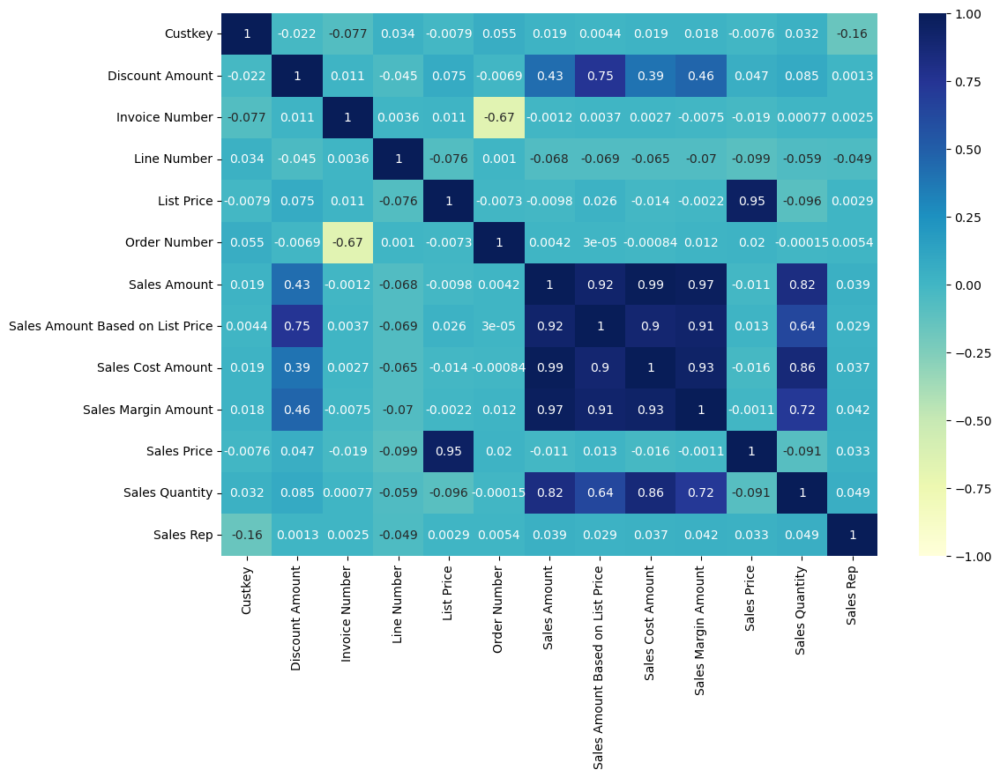

In [18]:
# Checking the correlation
plt.figure(figsize=(12,8))
sns.heatmap(sales_data.corr(method='pearson'), annot=True, vmin=-1, vmax=1, cmap='YlGnBu')

In [19]:
# set style
sns.set(style = 'darkgrid')

In [20]:
DaySalesInsights = sales_data01.copy()
DaySalesInsights['Invoice_Date'] = pd.to_datetime(sales_data01['Invoice Date']).dt.date

In [21]:
top10sales = DaySalesInsights.groupby('Invoice_Date').sum().sort_values('Sales Amount', ascending = False)
top10sales = top10sales.reset_index().head(10)

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\3522429975.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  top10sales = DaySalesInsights.groupby('Invoice_Date').sum().sort_values('Sales Amount', ascending = False)


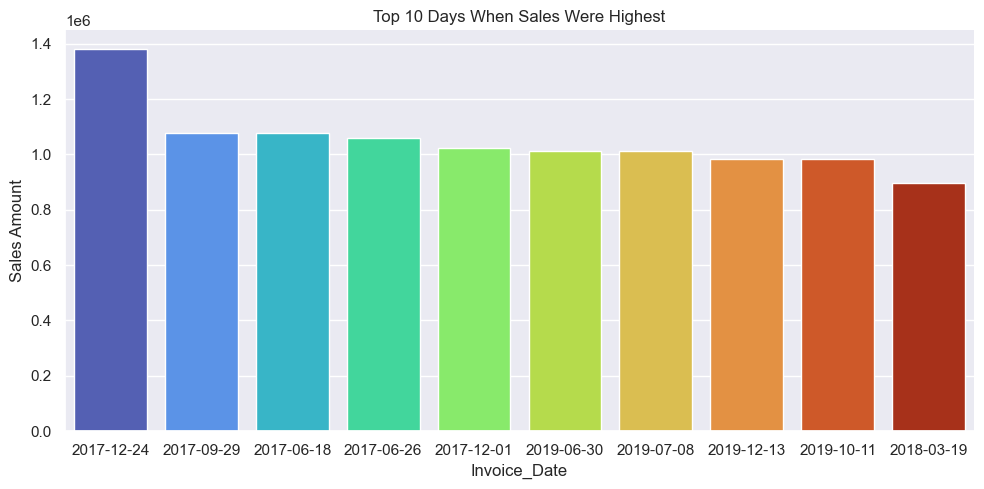

In [22]:
sns.catplot(y = 'Sales Amount', x = 'Invoice_Date', data = top10sales, aspect = 2,palette='turbo',kind="bar")
plt.title('Top 10 Days When Sales Were Highest')
top10sales[['Sales Amount']]
plt.show()

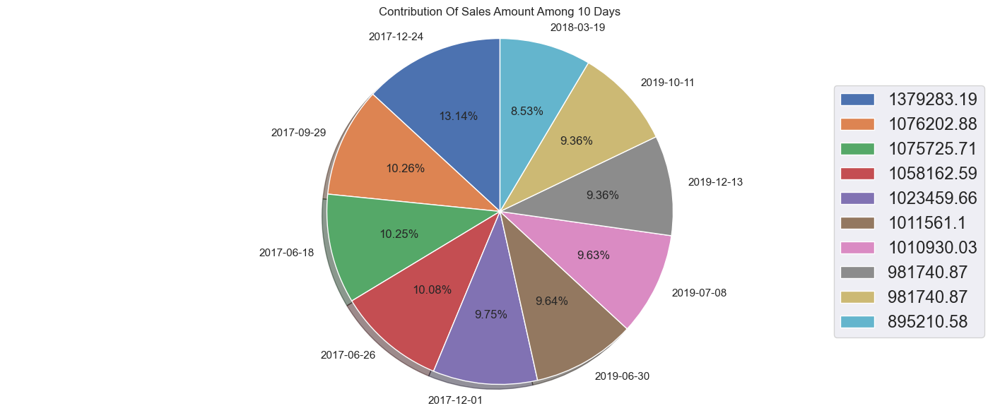

In [23]:
plt.figure(figsize=(18,7))
plt.pie('Sales Amount',labels='Invoice_Date',data = top10sales,
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Contribution Of Sales Amount Among 10 Days')
plt.legend(round(top10sales['Sales Amount'],2), loc=7, fontsize = 'x-large')
plt.show()

In [24]:
top10profits = DaySalesInsights.groupby('Invoice_Date').sum().sort_values('Sales Margin Amount', ascending = False)
top10profits = top10profits.reset_index().head(10)

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\3110231809.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  top10profits = DaySalesInsights.groupby('Invoice_Date').sum().sort_values('Sales Margin Amount', ascending = False)


,Sales Margin Amount
0,619085.33
1,480769.87
2,477173.34
3,450965.94
4,436621.64
5,413530.29
6,406118.86
7,398430.22
8,398222.72
9,392326.13


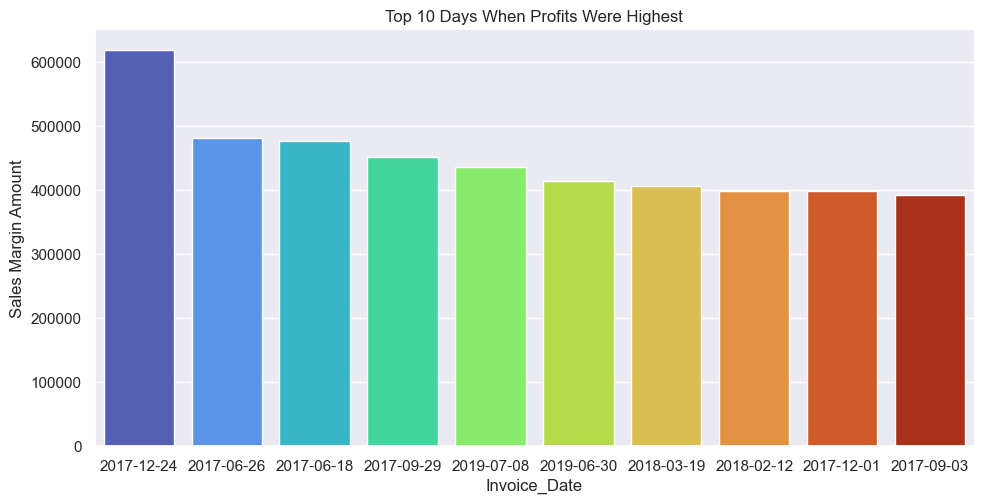

In [25]:
sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Date', data = top10profits, aspect = 2,palette='turbo',kind="bar")
plt.title('Top 10 Days When Profits Were Highest')
top10profits[['Sales Margin Amount']]

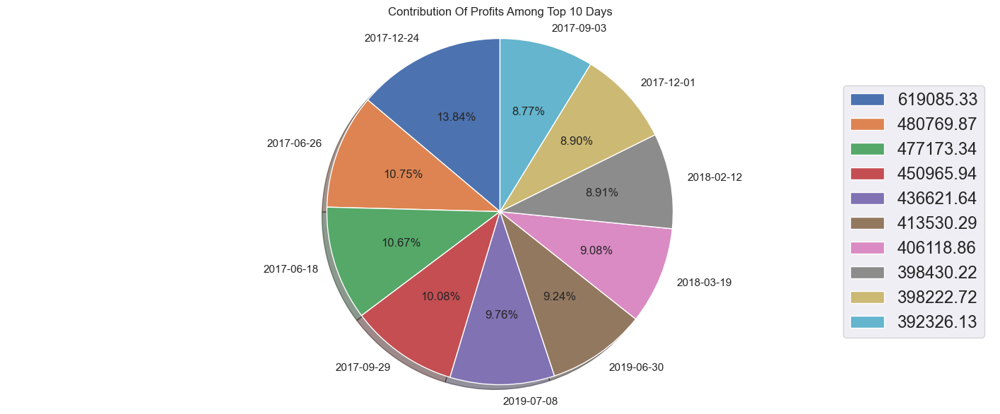

In [26]:
plt.figure(figsize=(18,7))
plt.pie('Sales Margin Amount',labels='Invoice_Date',data = top10profits,
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Contribution Of Profits Among Top 10 Days')
plt.legend(round(top10profits['Sales Margin Amount'],2), loc=7, fontsize = 'x-large')
plt.show()

In [27]:
highqty = DaySalesInsights.groupby('Invoice_Date').sum().sort_values('Sales Quantity', ascending = False)
highqty = highqty.reset_index().head(10)

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\3893251231.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  highqty = DaySalesInsights.groupby('Invoice_Date').sum().sort_values('Sales Quantity', ascending = False)


,Sales Quantity
0,23710
1,23708
2,17822
3,17820
4,17819
5,17819
6,17819
7,17819
8,17819
9,17649


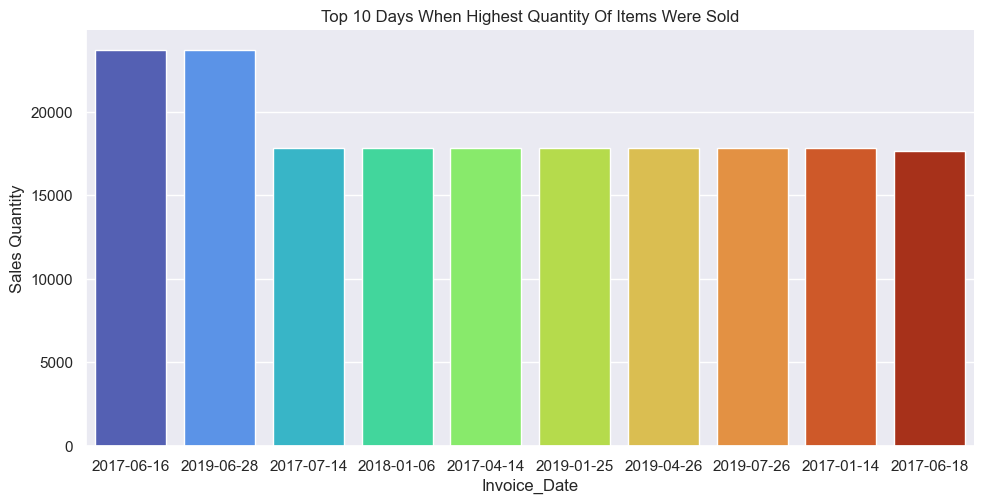

In [28]:
sns.catplot(y = 'Sales Quantity', x = 'Invoice_Date', data = highqty, aspect = 2,palette='turbo',kind="bar")
plt.title('Top 10 Days When Highest Quantity Of Items Were Sold')
highqty[['Sales Quantity']]

In [30]:
MostCust = DaySalesInsights.groupby(['Invoice_Date']).count().sort_values('Custkey', ascending = False)
MostCust = MostCust.reset_index().head(10)

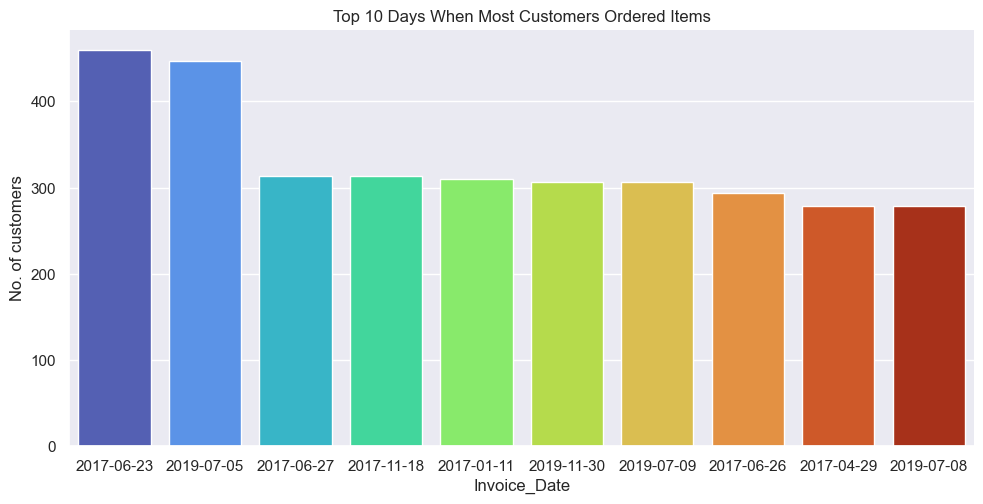

In [32]:
sns.catplot(y = 'Custkey', x = 'Invoice_Date', data = MostCust, aspect = 2,palette='turbo',kind="bar")
plt.title('Top 10 Days When Most Customers Ordered Items')
plt.ylabel('No. of customers')
plt.show()

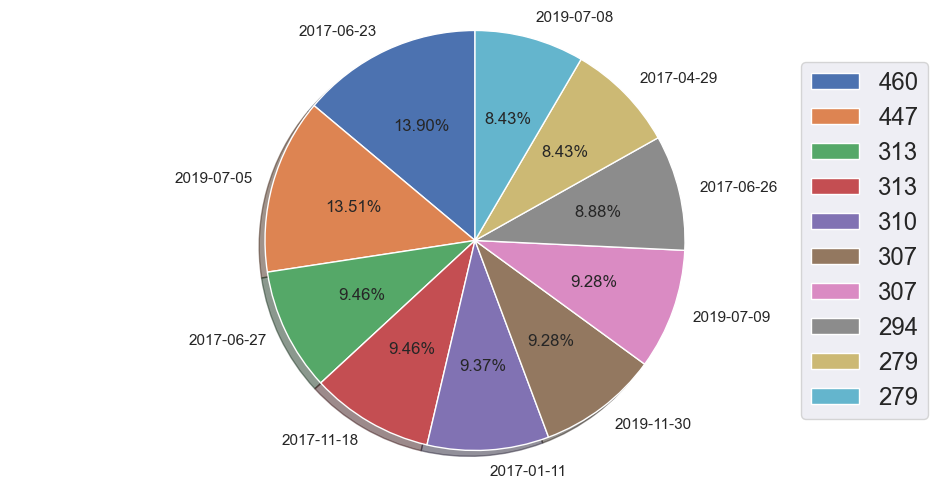

In [35]:
plt.figure(figsize=(12,6))
plt.pie(x = 'Custkey', labels = 'Invoice_Date', data = MostCust,
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.legend(MostCust['Custkey'], loc=7, fontsize = 'x-large')
plt.show()

In [37]:
Yearly_Sales =  sales_data02[['Custkey','Item','Invoice Date','Invoice_Year','Invoice_Month',
                            'Sales Quantity', 'Sales Amount Based on List Price','Discount Amount',
                           'Sales Amount', 'Sales Margin Amount','Sales Cost Amount','Sales Rep','U/M','List Price',
                           'Sales Price']]


C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\995191693.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Yearly_Sales01 = Yearly_Sales.groupby('Invoice_Year').sum().reset_index()


,Invoice_Year,Sales Amount
0,2017,87416173.83
1,2018,20817471.00
2,2019,77906591.65


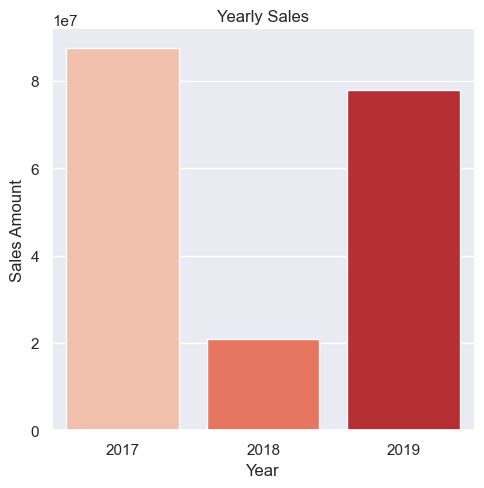

In [38]:
Yearly_Sales01 = Yearly_Sales.groupby('Invoice_Year').sum().reset_index()
sns.catplot(y = 'Sales Amount', x = 'Invoice_Year', data = Yearly_Sales01, palette='Reds',kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Amount')
plt.title('Yearly Sales')
Yearly_Sales01[['Invoice_Year', 'Sales Amount']]

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\4212599347.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data= sales_data02.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),


<Axes: xlabel='Invoice_Month', ylabel='Sales Amount'>

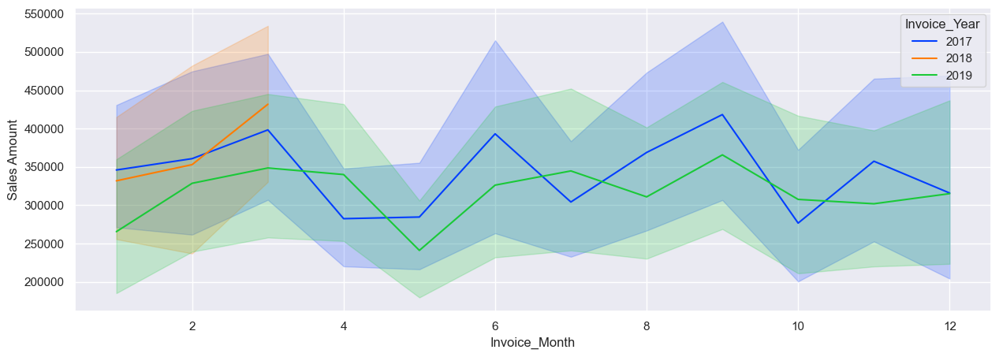

In [39]:
plt.figure(figsize = (15,5))
sns.lineplot(y ='Sales Amount', x = 'Invoice_Month',
             data= sales_data02.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),
             hue = 'Invoice_Year', palette='bright')

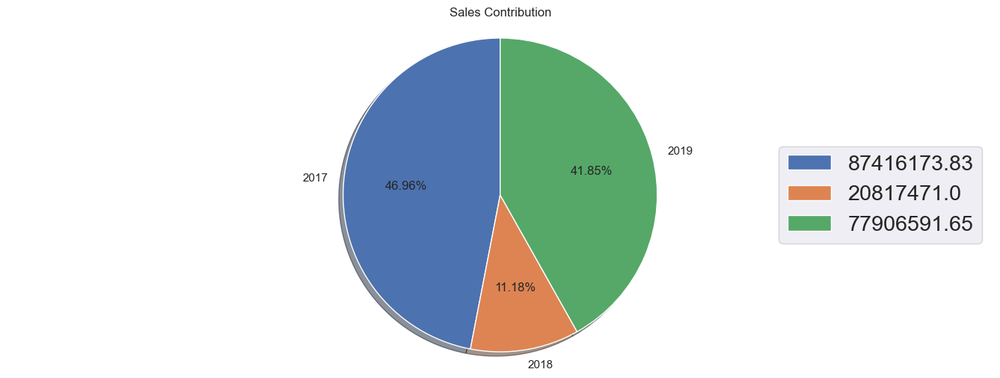

In [40]:
#Plotting Piechart to know Sales Share among 3 years
plt.figure(figsize=(17,6))
plt.pie('Sales Amount',labels='Invoice_Year',data=Yearly_Sales01,
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Sales Contribution')
plt.legend(round(Yearly_Sales01['Sales Amount'],2), loc=7, fontsize = 'xx-large')
plt.show()

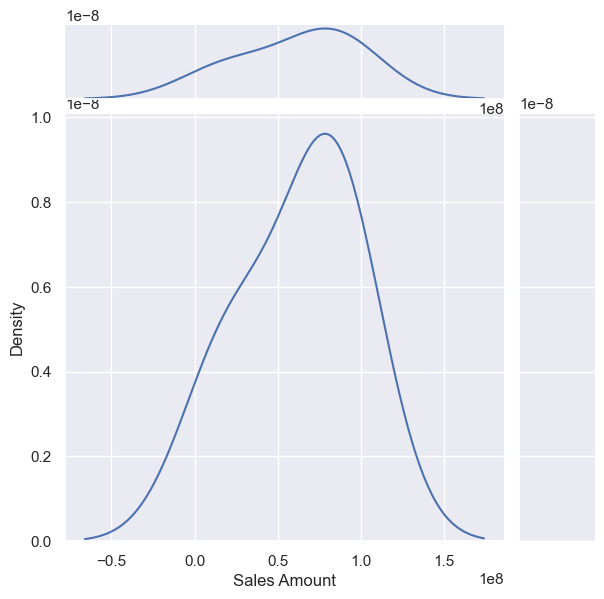

In [41]:
sns.jointplot(x='Sales Amount',data=Yearly_Sales01,kind='kde')

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\1729594574.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data=sales_data02.groupby(['Invoice_Year','Invoice_Month','Invoice_Day']).sum().reset_index(),


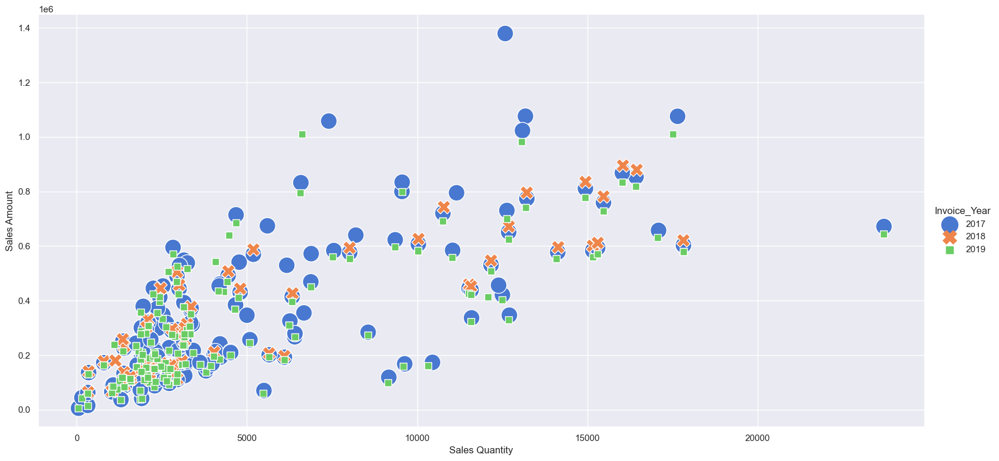

In [42]:
sns.relplot(x ='Sales Quantity',y = 'Sales Amount',
            data=sales_data02.groupby(['Invoice_Year','Invoice_Month','Invoice_Day']).sum().reset_index(),
            hue='Invoice_Year',height=8,aspect= 2, size='Invoice_Year',palette='muted',
            style= 'Invoice_Year', sizes = (400,150))

Text(0, 0.5, 'Count')

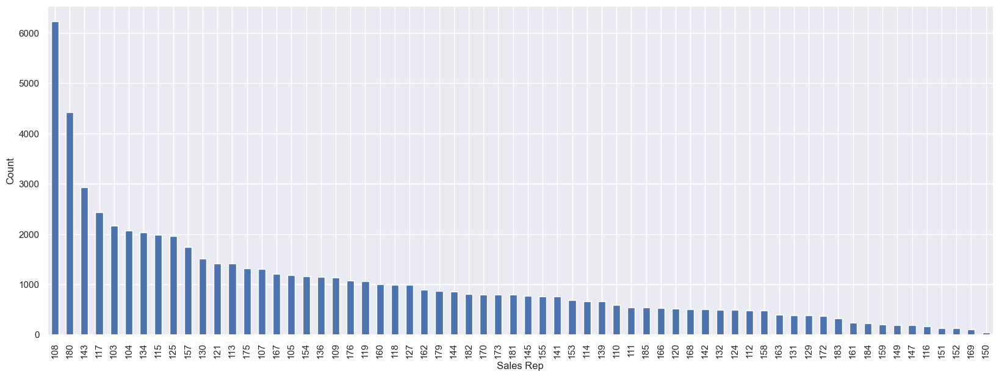

In [43]:
plt.figure(figsize=(20, 7))
sales_data01['Sales Rep'].value_counts().plot.bar()
plt.xlabel('Sales Rep')
plt.ylabel('Count')

In [44]:
Yearly_Monthwise_Sales = sales_data02.groupby(['Invoice_Year','Invoice_Month']).sum().reset_index()
Yearly_Monthwise_Sales.iloc[:,6:].describe()

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\2563918518.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Yearly_Monthwise_Sales = sales_data02.groupby(['Invoice_Year','Invoice_Month']).sum().reset_index()


,Sales Amount Based on List Price,Discount Amount,Sales Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,27.000000,2.700000e+01,27.000000
mean,1.138195e+07,4.487867e+06,6.894083e+06,2.878081e+06,4.016002e+06,332051.629630,1.244444e+06,684424.211545
std,2.221001e+06,1.231310e+06,1.142849e+06,5.140769e+05,6.506092e+05,55272.649267,2.116411e+05,115919.100453
min,4.900167e+06,1.712686e+06,3.187481e+06,1.290189e+06,1.897292e+06,130314.000000,5.042254e+05,270807.438237
25%,1.077866e+07,4.024413e+06,6.461181e+06,2.617101e+06,3.688586e+06,306638.500000,1.143268e+06,620357.646120
50%,1.152212e+07,4.815936e+06,6.895858e+06,2.882060e+06,4.092856e+06,339909.000000,1.259842e+06,694170.910154
75%,1.278649e+07,5.277200e+06,7.600667e+06,3.134162e+06,4.370919e+06,366028.000000,1.365313e+06,752295.240603
max,1.472000e+07,6.112159e+06,8.783739e+06,3.807619e+06,5.041842e+06,404161.000000,1.558636e+06,873625.957968


**************************************************Yearly-Monthwise Sales Trend**************************************************


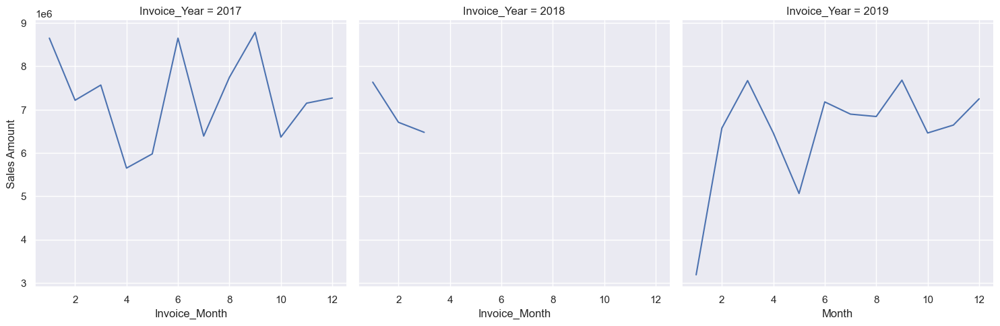

In [45]:
sns.relplot(x ='Invoice_Month',y = 'Sales Amount', data=Yearly_Monthwise_Sales,height=5,
            kind = 'line', aspect = 1, col = 'Invoice_Year')
plt.xlabel('Month')
plt.ylabel('Sales Amount')
print('*'*50+'Yearly-Monthwise Sales Trend'+'*'*50)

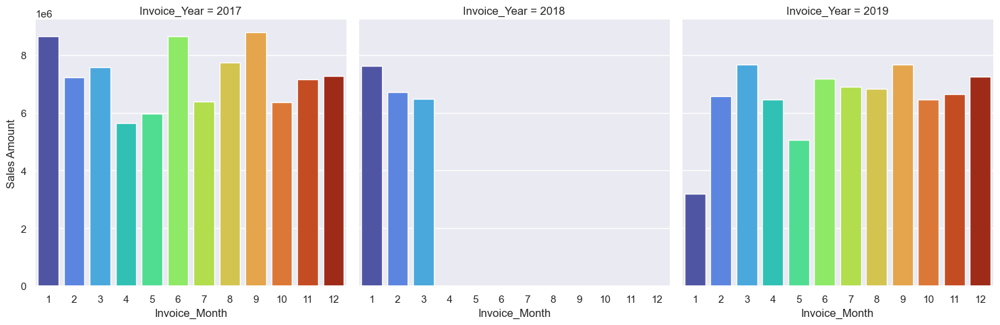

In [46]:
sns.catplot(y = 'Sales Amount', x = 'Invoice_Month', data = Yearly_Monthwise_Sales, palette='turbo',kind="bar",
            col='Invoice_Year', col_wrap=3)

<Axes: xlabel='Sales Amount', ylabel='Count'>

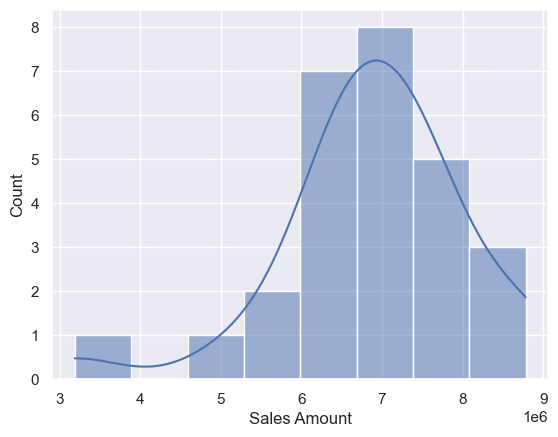

In [47]:
sns.histplot(Yearly_Monthwise_Sales['Sales Amount'], kde = True)

In [48]:
Monthly_sales = sales_data02.groupby(['Invoice_Year','Invoice_Month', 'Invoice_Day']).sum().reset_index()
Monthly_sales.iloc[:,5:].describe()

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\1761404394.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Monthly_sales = sales_data02.groupby(['Invoice_Year','Invoice_Month', 'Invoice_Day']).sum().reset_index()


,Sales Quantity,Sales Amount Based on List Price,Discount Amount,Sales Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,558.000000,5.580000e+02,5.580000e+02,5.580000e+02,558.000000,558.000000,558.000000,558.000000,558.000000
mean,5273.842294,5.507395e+05,2.171548e+05,3.335847e+05,139261.990215,194322.662975,16067.014337,60215.041709,33117.300559
std,4780.989763,3.885603e+05,1.819455e+05,2.299794e+05,96930.150685,135882.365942,8030.058779,31763.915640,17115.094129
min,56.000000,1.084864e+04,-2.555238e+05,5.433650e+03,2349.360000,3084.290000,345.000000,2033.880000,1063.117667
25%,2118.000000,2.585411e+05,8.911556e+04,1.573360e+05,63142.357500,92438.910000,10068.000000,40386.113325,22154.848425
50%,3118.000000,4.537218e+05,1.634601e+05,2.688299e+05,113446.860000,150548.000000,14681.500000,54665.030000,30154.046651
75%,6581.500000,7.178838e+05,2.896384e+05,4.696801e+05,195474.320000,267013.720000,19665.750000,72573.307400,40993.073432
max,23710.000000,2.408920e+06,1.029636e+06,1.379283e+06,619085.330000,760197.860000,55866.000000,231196.720800,128415.923388


C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\1601281156.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.relplot(y ='Sales Quantity',x = 'Sales Amount', data=sales_data02,height = 3,aspect=1,


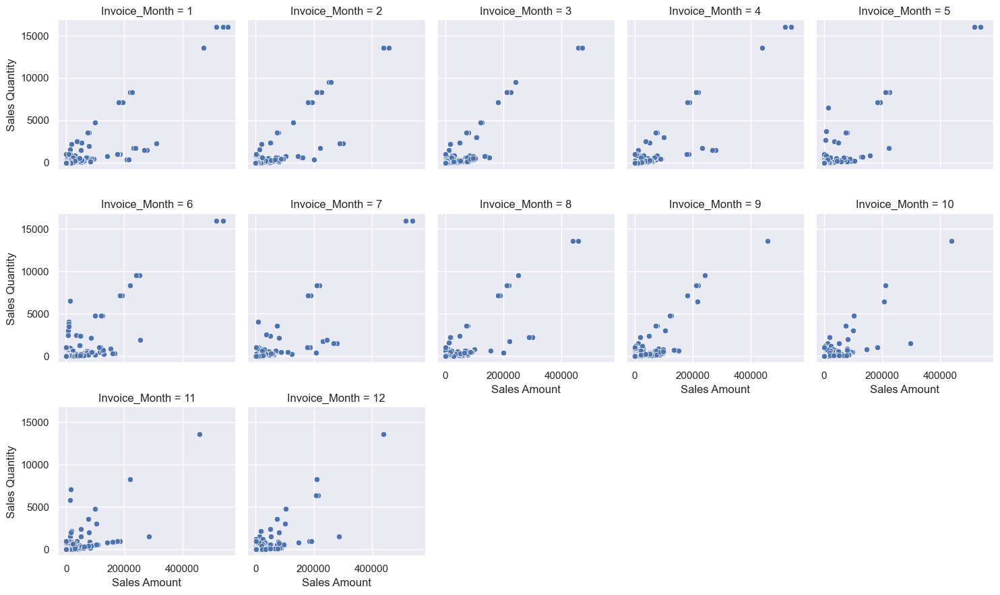

In [49]:
sns.relplot(y ='Sales Quantity',x = 'Sales Amount', data=sales_data02,height = 3,aspect=1,
            col = 'Invoice_Month',col_wrap=5, palette='muted')

**************************************************Monthly Sales Trend in 2017**************************************************


<Figure size 800x2000 with 0 Axes>

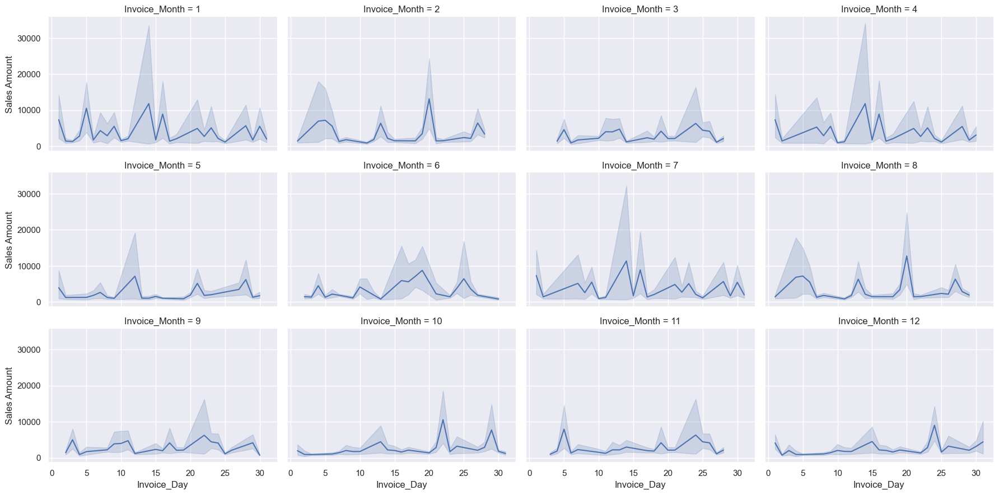

In [50]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data02.query('Invoice_Year == 2017'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2017'+'*'*50)

**********************************************Monthly Sales Quantity Trend in 2017**********************************************


<Figure size 800x2000 with 0 Axes>

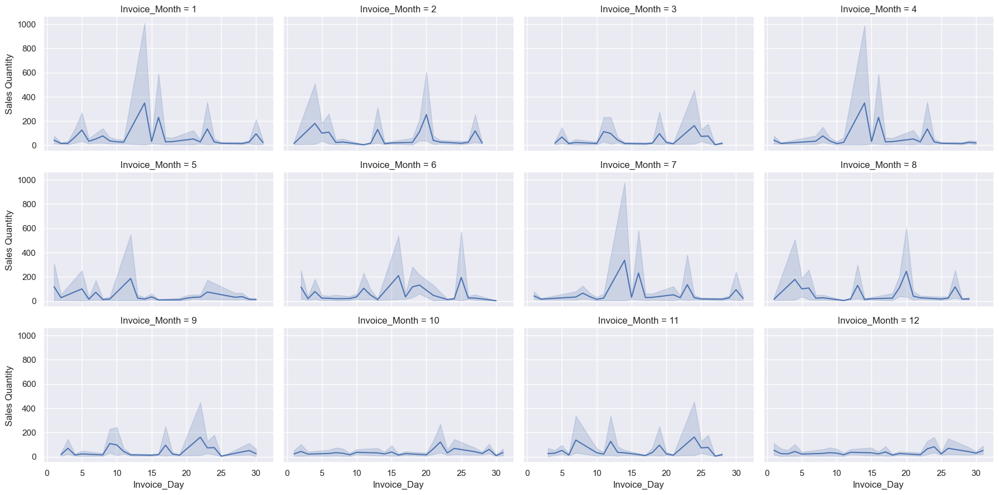

In [51]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Quantity', data= sales_data02.query('Invoice_Year == 2017'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*46+'Monthly Sales Quantity Trend in 2017'+'*'*46)

****************************************Daily Total Sales Trend per Month in 2017****************************************


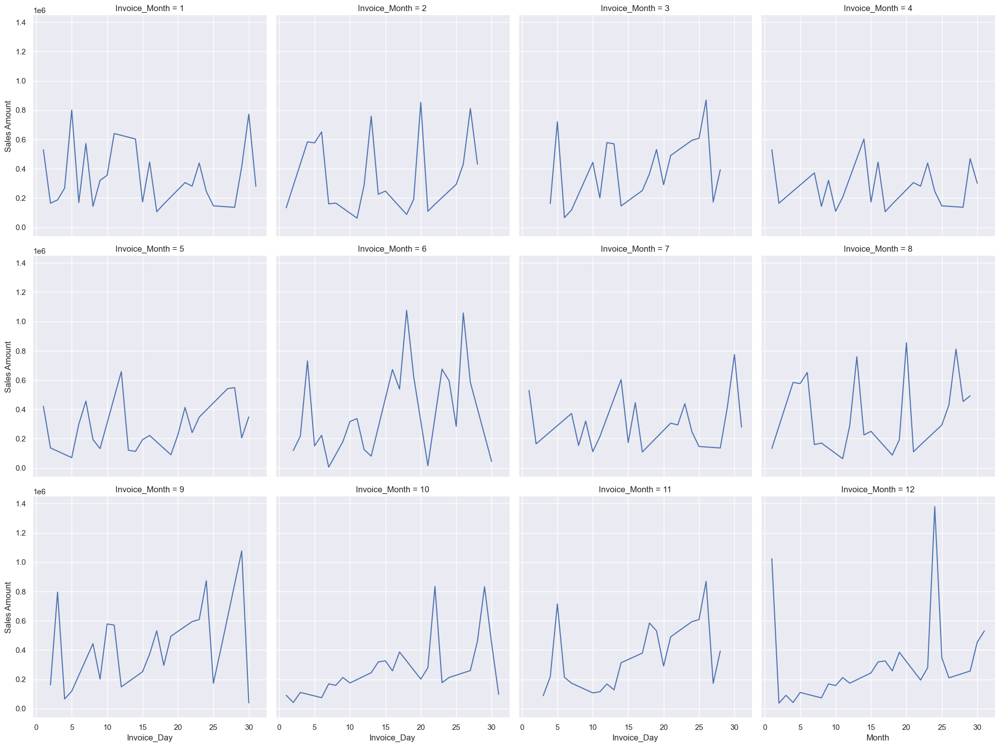

In [52]:
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data=Monthly_sales.query('Invoice_Year == 2017'),
            kind = 'line', aspect = 1, col = 'Invoice_Month', col_wrap = 4)
plt.xlabel('Month')
plt.ylabel('Sales Amount')
print('*'*40+'Daily Total Sales Trend per Month in 2017'+'*'*40)

**************************************************Monthly Sales Trend in 2018**************************************************


<Figure size 800x2000 with 0 Axes>

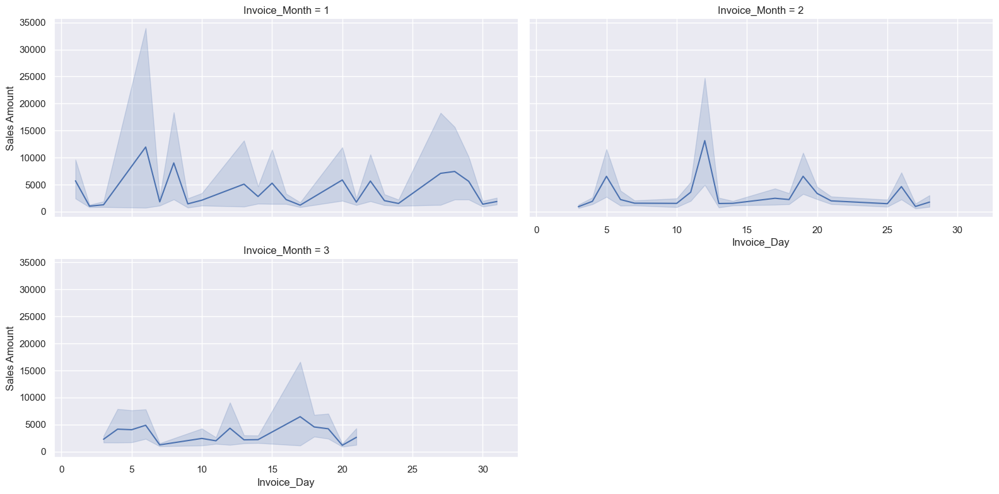

In [53]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data02.query('Invoice_Year == 2018'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2018'+'*'*50)

*********************************************Monthly Sales Quantity Trend in 2018*********************************************


<Figure size 800x2000 with 0 Axes>

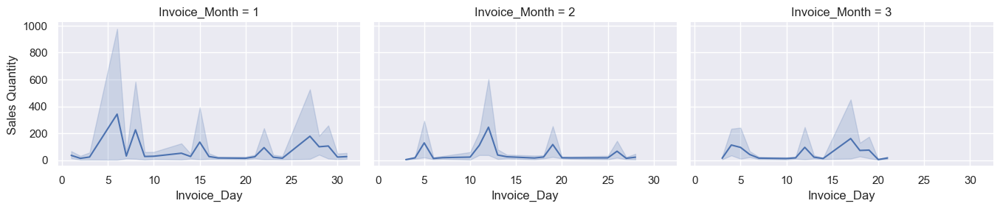

In [54]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Quantity', data= sales_data02.query('Invoice_Year == 2018'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*45+'Monthly Sales Quantity Trend in 2018'+'*'*45)

****************************************Daily Total Sales Trend per Month in 2018****************************************


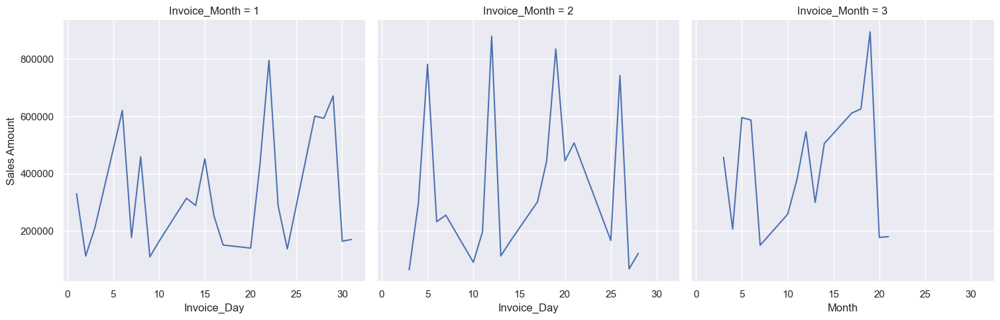

In [55]:
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data=Monthly_sales.query('Invoice_Year == 2018'),
            kind = 'line', aspect = 1, col = 'Invoice_Month', col_wrap = 4)
plt.xlabel('Month')
plt.ylabel('Sales Amount')
print('*'*40+'Daily Total Sales Trend per Month in 2018'+'*'*40)

**************************************************Monthly Sales Trend in 2019**************************************************


<Figure size 800x2000 with 0 Axes>

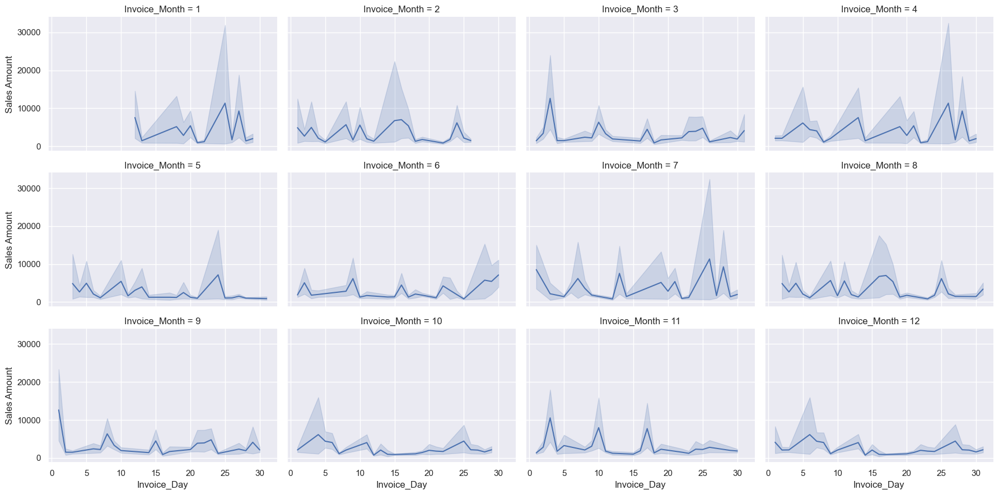

In [56]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data02.query('Invoice_Year == 2019'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2019'+'*'*50)

*******************************************Monthly Sales Quantity Trend in 2019*********************************************


<Figure size 800x2000 with 0 Axes>

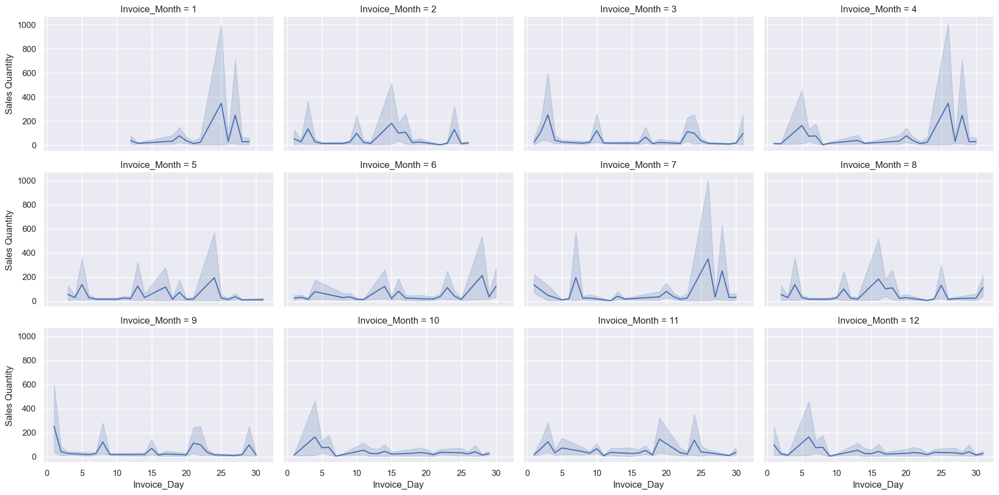

In [57]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Quantity', data= sales_data02.query('Invoice_Year == 2019'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*43+'Monthly Sales Quantity Trend in 2019'+'*'*45)

****************************************Daily Total Sales Trend per Month in 2018****************************************


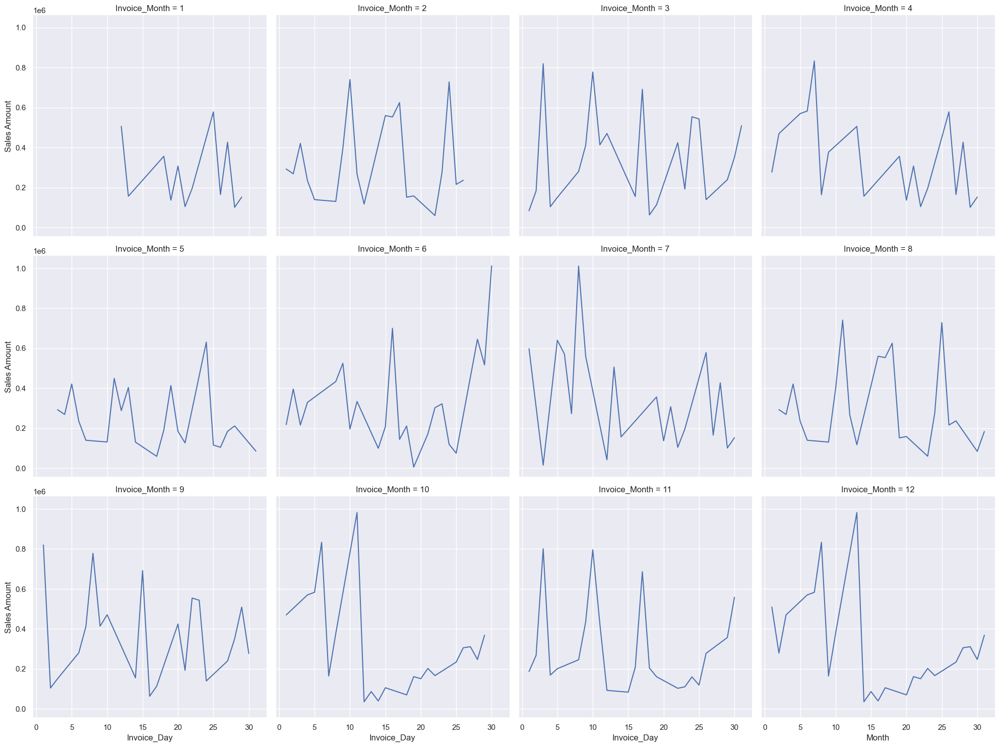

In [58]:
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data=Monthly_sales.query('Invoice_Year == 2019'),
            kind = 'line', aspect = 1, col = 'Invoice_Month', col_wrap = 4)
plt.xlabel('Month')
plt.ylabel('Sales Amount')
print('*'*40+'Daily Total Sales Trend per Month in 2018'+'*'*40)

----------------------------------------Monthly Quantity Purchased Trend in 2017----------------------------------------


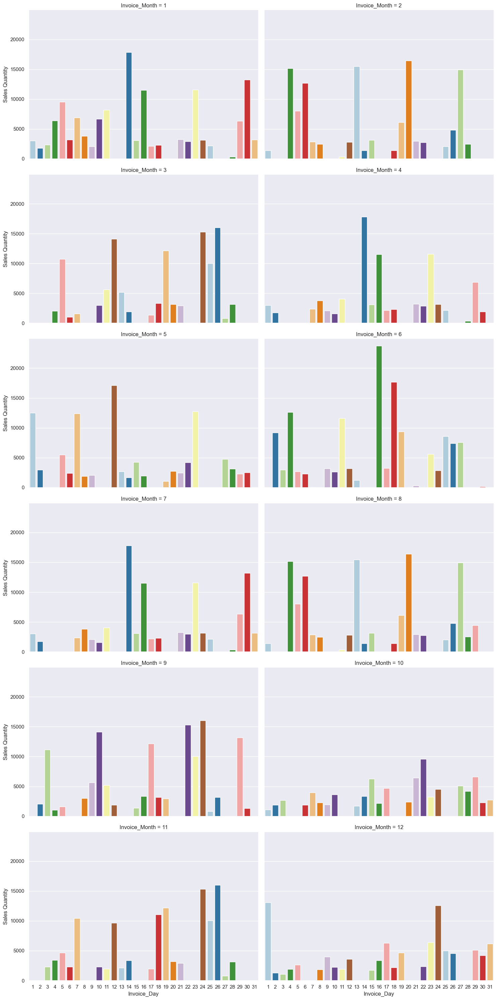

In [59]:
sns.catplot(y = 'Sales Quantity', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2017], aspect=1.5,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)
print('-'*40+'Monthly Quantity Purchased Trend in 2017'+'-'*40)

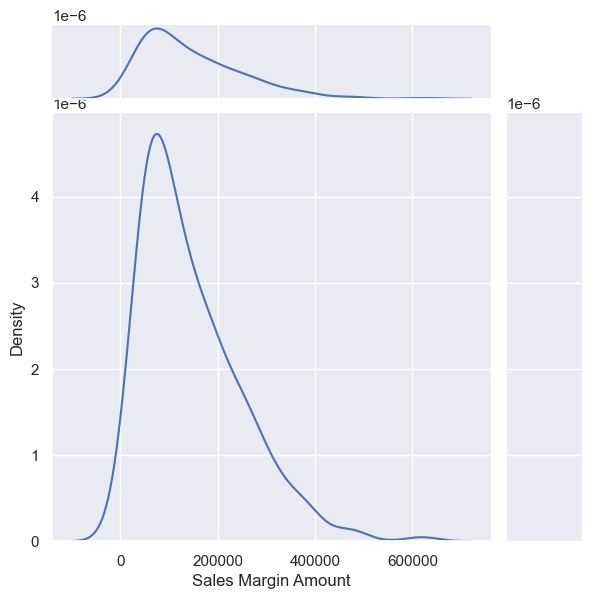

In [60]:
sns.jointplot(x='Sales Margin Amount',data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2017],ratio=5,kind='kde')

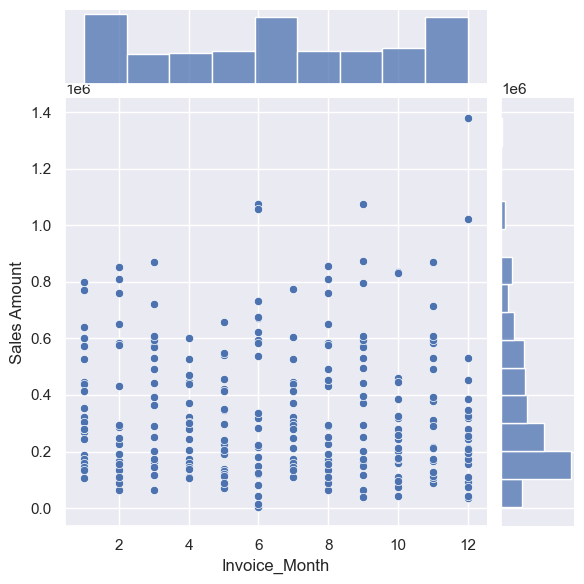

In [61]:
sns.jointplot(x = 'Invoice_Month', y='Sales Amount', data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2017])

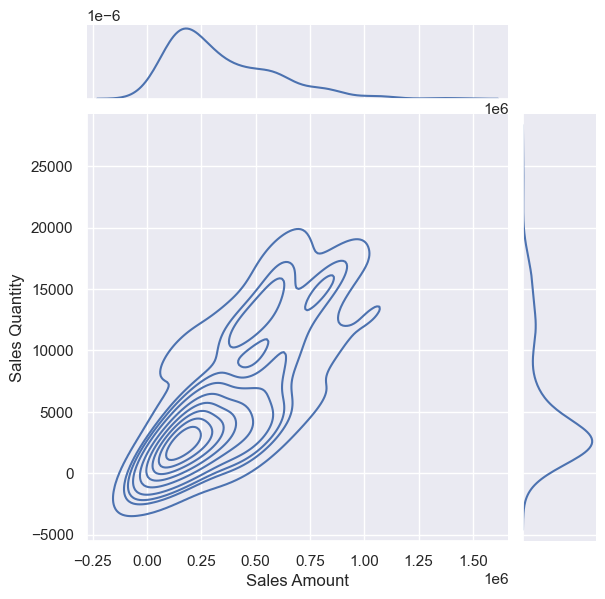

In [62]:
sns.jointplot(y = 'Sales Quantity', x='Sales Amount',
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2017], kind='kde')

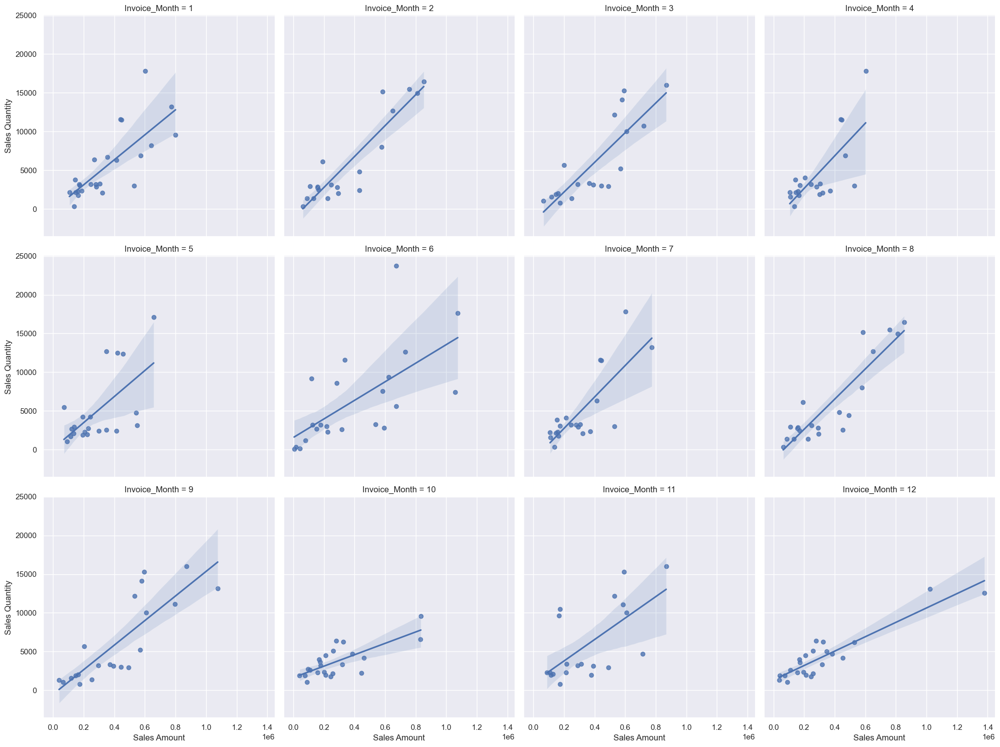

In [63]:
sns.lmplot(x='Sales Amount',y = 'Sales Quantity', 
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2017], col='Invoice_Month', col_wrap=4)

--------------------------------------------Monthly Sales Amount Trend in 2017--------------------------------------------


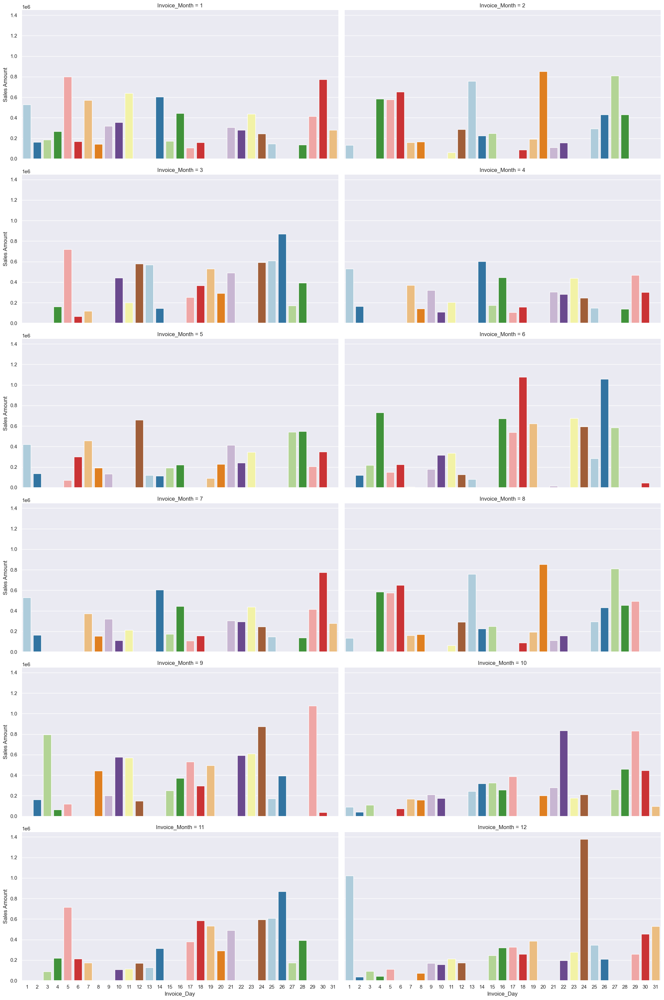

In [64]:
sns.catplot(y = 'Sales Amount', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2017], aspect=2,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)
print('-'*44+'Monthly Sales Amount Trend in 2017'+'-'*44)

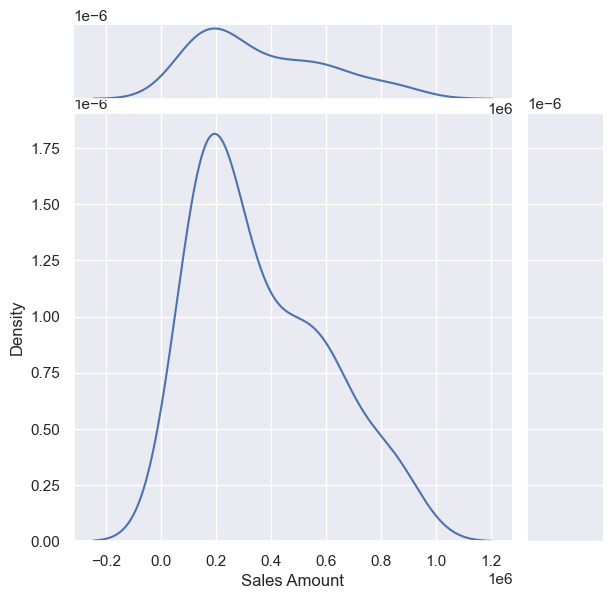

In [65]:
sns.jointplot(x='Sales Amount',data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2018],ratio=5,kind='kde')

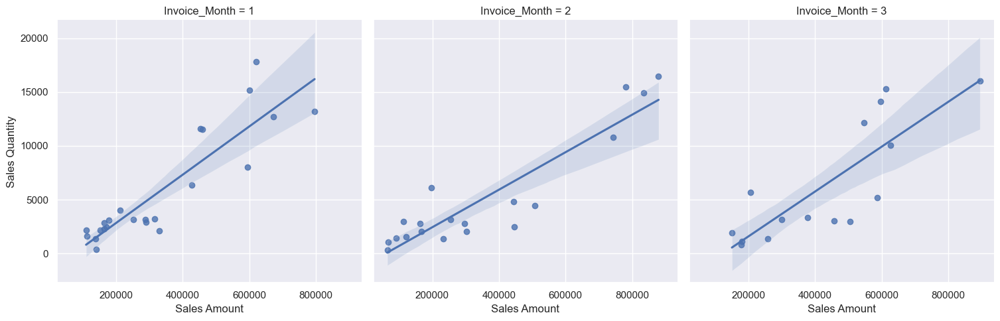

In [66]:
sns.lmplot(x='Sales Amount',y = 'Sales Quantity', 
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2018], col='Invoice_Month', col_wrap=4)

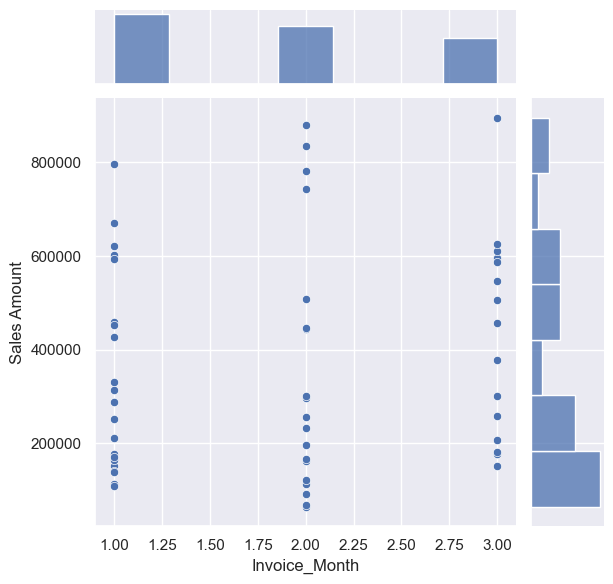

In [67]:
sns.jointplot(x = 'Invoice_Month', y='Sales Amount', data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2018])

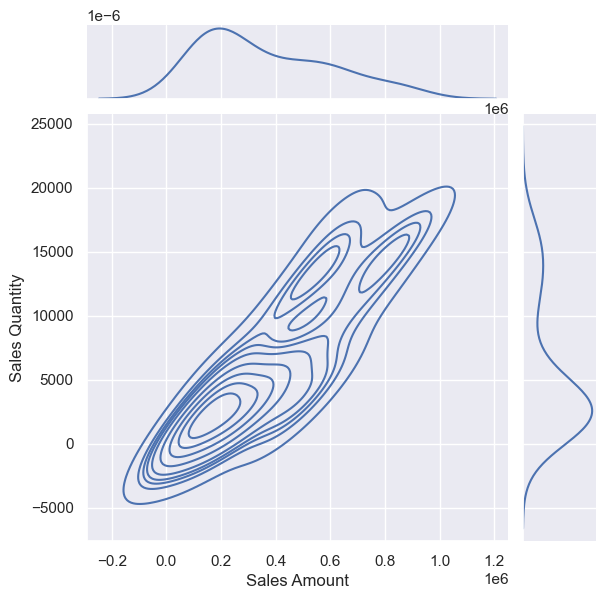

In [68]:
sns.jointplot(y = 'Sales Quantity', x='Sales Amount',
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2018], kind='kde')

----------------------------------------Monthly Quantity Purchased Trend in 2018----------------------------------------


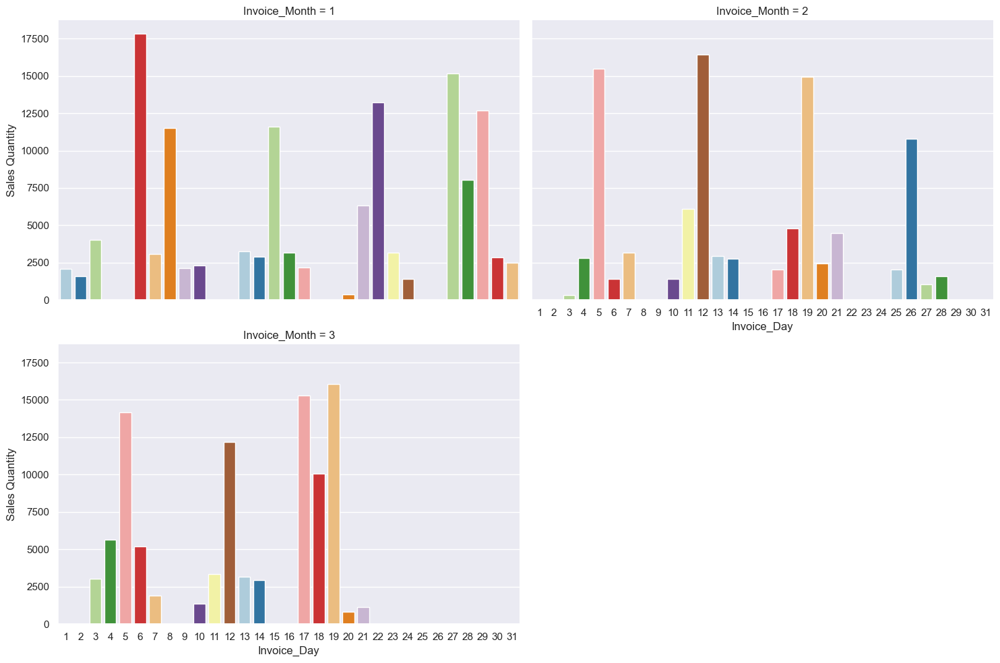

In [69]:
sns.catplot(y = 'Sales Quantity', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2018], aspect=1.5,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)
print('-'*40+'Monthly Quantity Purchased Trend in 2018'+'-'*40)

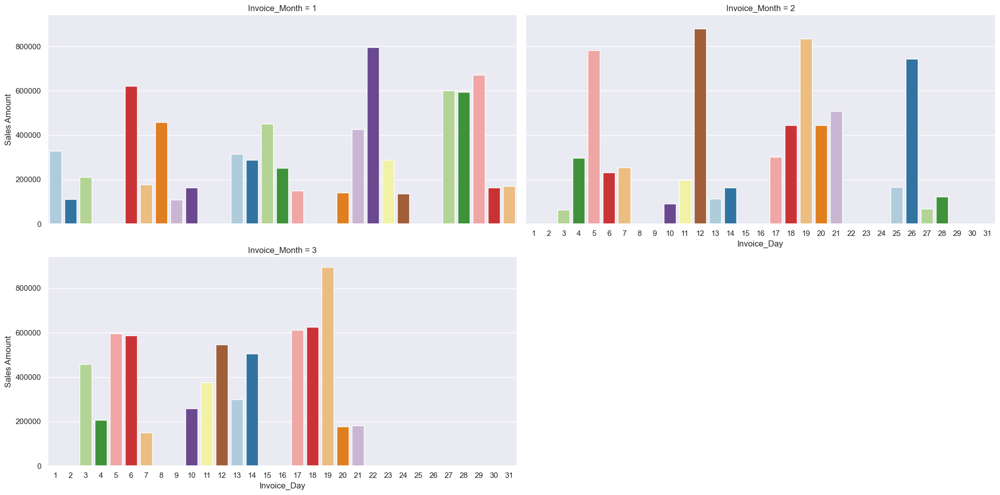

In [70]:
sns.catplot(y = 'Sales Amount', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2018], aspect=2,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)

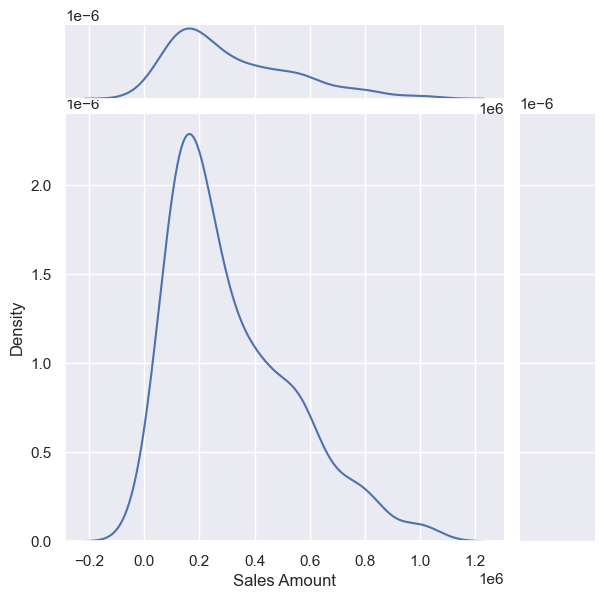

In [71]:
sns.jointplot(x='Sales Amount',data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2019],ratio=5,kind='kde')

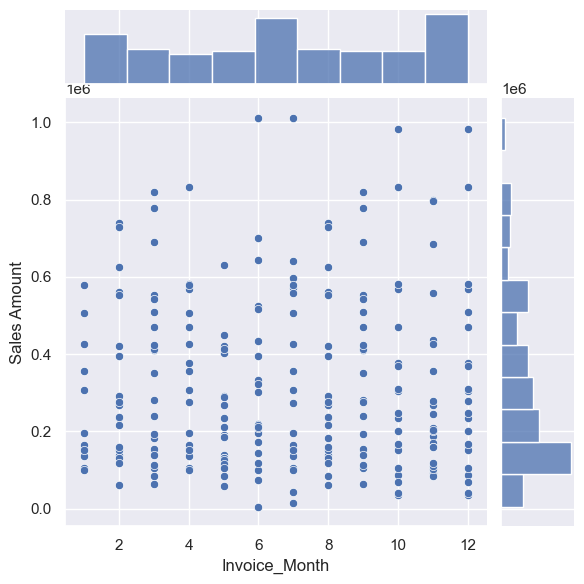

In [72]:
sns.jointplot(x = 'Invoice_Month', y='Sales Amount', data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2019])

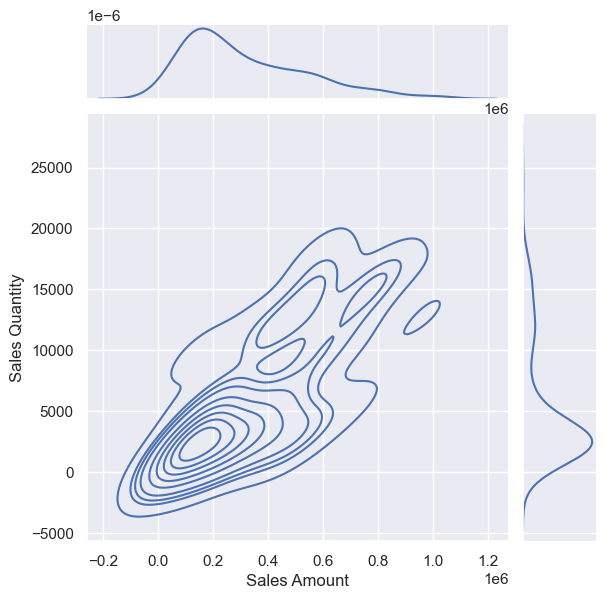

In [73]:
sns.jointplot(y = 'Sales Quantity', x='Sales Amount',
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2019], kind='kde')

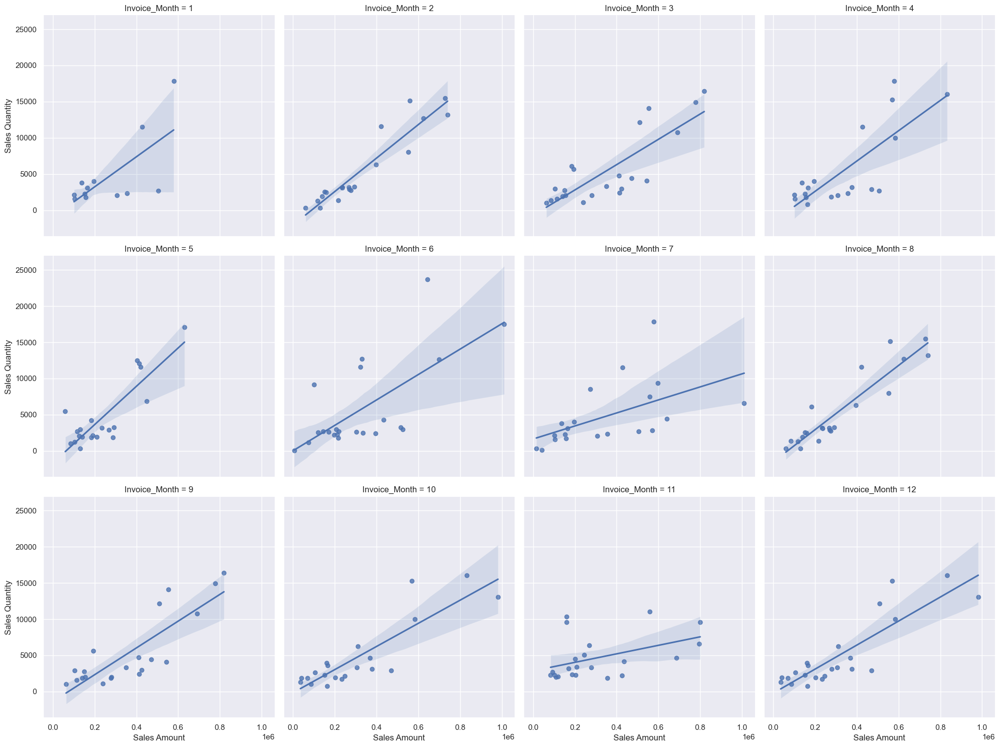

In [74]:
sns.lmplot(x='Sales Amount',y = 'Sales Quantity', 
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2019], col='Invoice_Month', col_wrap=4)

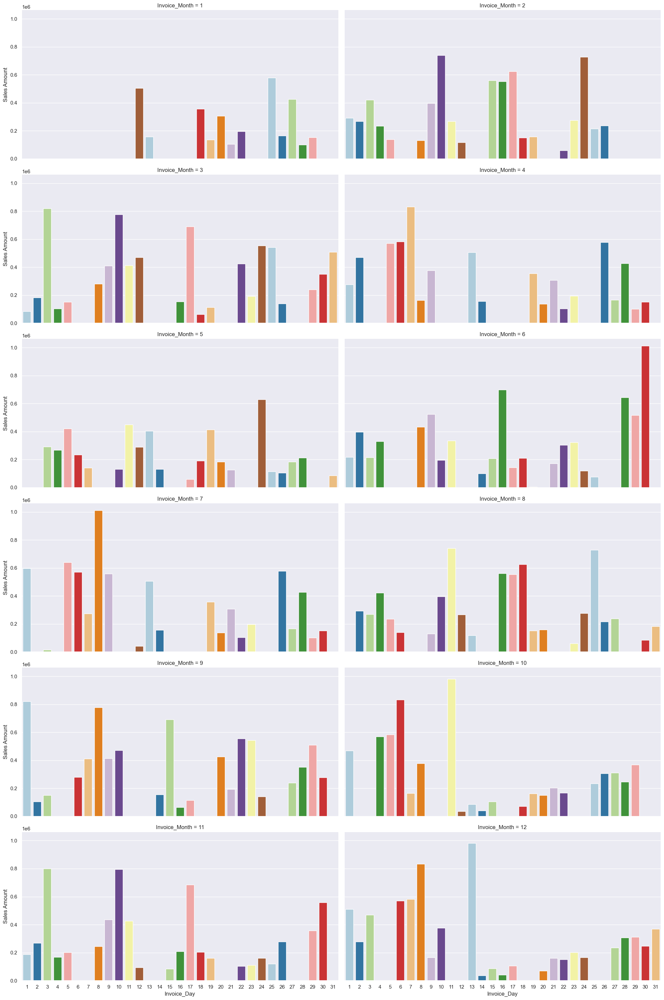

In [75]:
sns.catplot(y = 'Sales Amount', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2019], aspect=2,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)

----------------------------------------Monthly Quantity Purchased Trend in 2019----------------------------------------


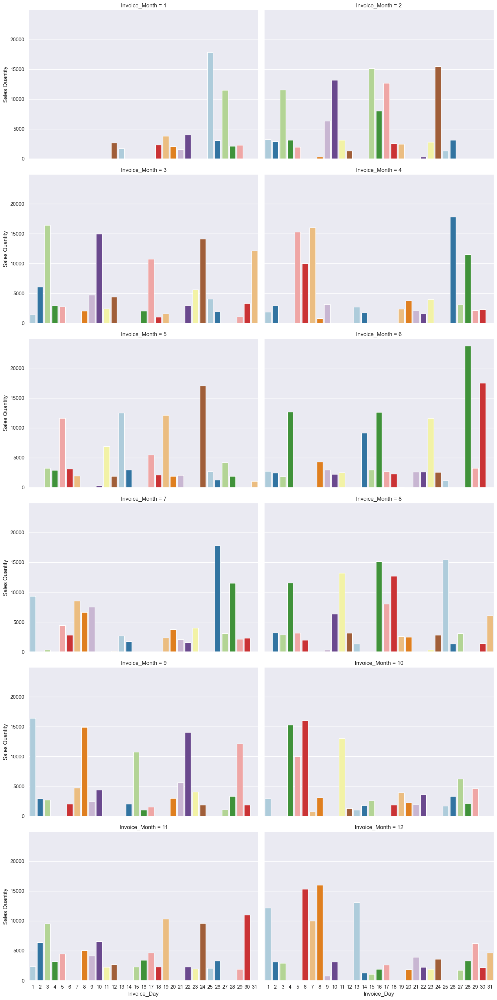

In [76]:
sns.catplot(y = 'Sales Quantity', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2019], aspect=1.5,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)
print('-'*40+'Monthly Quantity Purchased Trend in 2019' + '-'*40)

<Axes: xlabel='Sales Amount', ylabel='Count'>

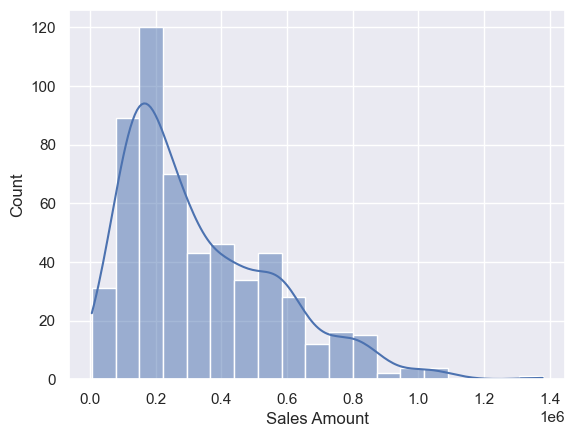

In [77]:
sns.histplot(Monthly_sales['Sales Amount'], kde = True)

,Invoice_Year,Sales Margin Amount
0,2017,37378341.75
1,2018,9147547.74
2,2019,31182301.05


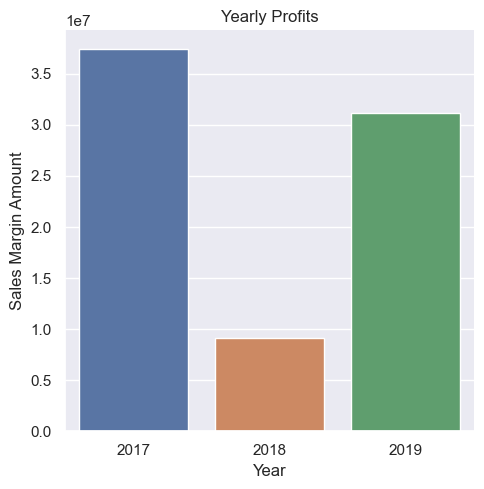

In [78]:
sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Year', data = Yearly_Sales01,kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Margin Amount')
plt.title('Yearly Profits')
Yearly_Sales01[['Invoice_Year', 'Sales Margin Amount']]

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\898838514.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data= sales_data02.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),


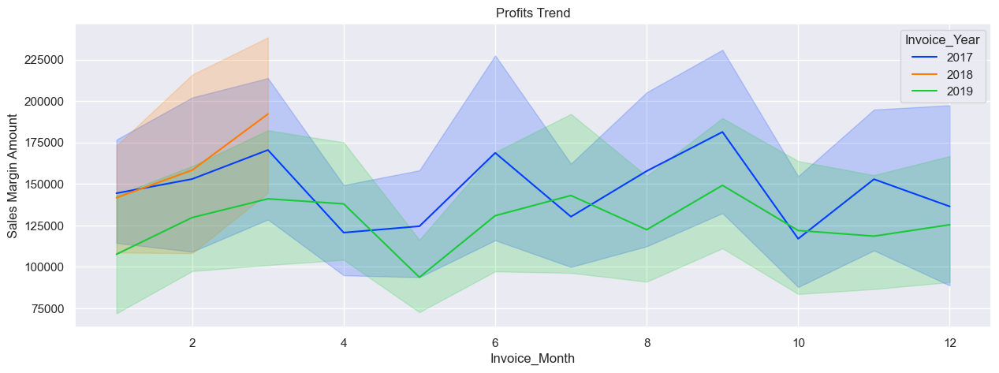

In [79]:
plt.figure(figsize = (15,5))
sns.lineplot(y ='Sales Margin Amount', x = 'Invoice_Month',
             data= sales_data02.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),
             hue = 'Invoice_Year', palette='bright')
plt.title('Profits Trend')
plt.show()

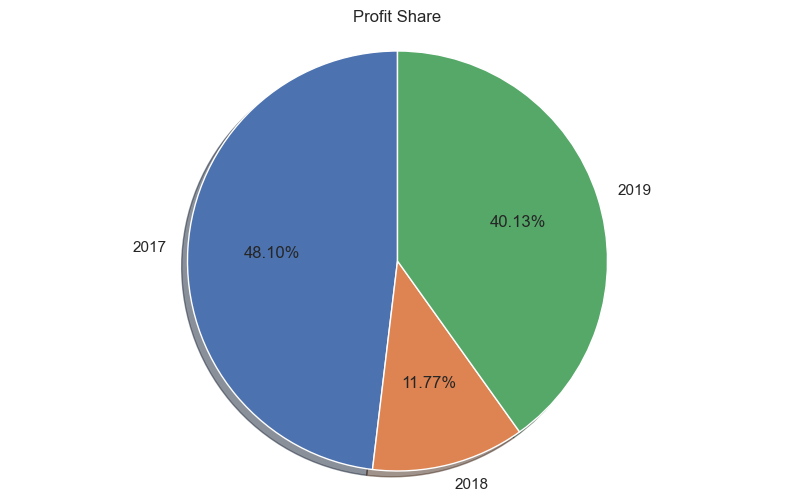

In [80]:
plt.figure(figsize=(10,6))
plt.pie('Sales Margin Amount',labels='Invoice_Year',data=Yearly_Sales01[['Invoice_Year', 'Sales Margin Amount']],
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Profit Share')
plt.show()

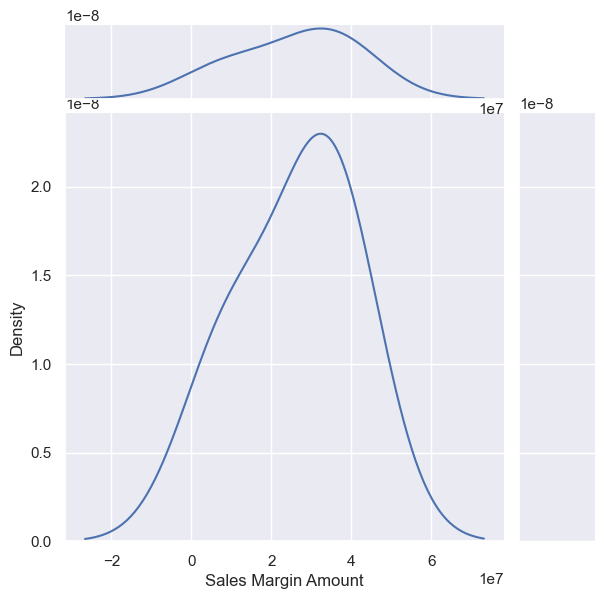

In [81]:
sns.jointplot(x='Sales Margin Amount',data=Yearly_Sales01,kind='kde')

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\3771959043.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data=sales_data02.groupby(['Invoice_Year','Invoice_Month','Invoice_Day']).sum().reset_index(),


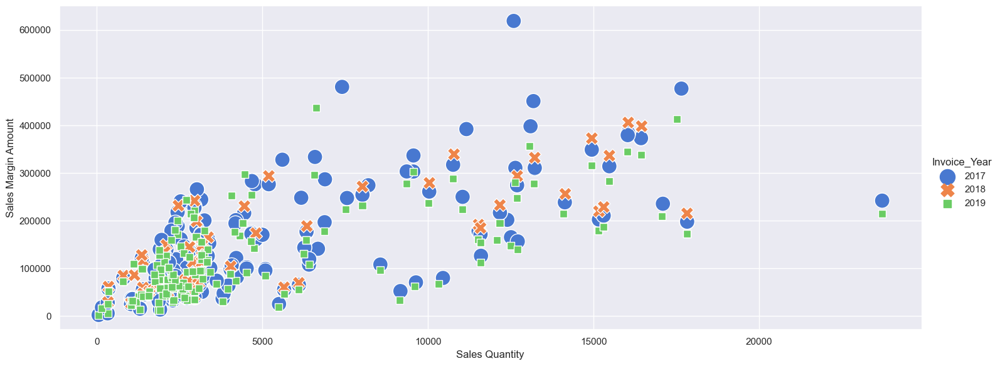

In [82]:
sns.relplot(x ='Sales Quantity',y = 'Sales Margin Amount',
            data=sales_data02.groupby(['Invoice_Year','Invoice_Month','Invoice_Day']).sum().reset_index(),
            hue='Invoice_Year',height=6,aspect=2.5, size='Invoice_Year',palette='muted',
            style= 'Invoice_Year', sizes = (300,150))

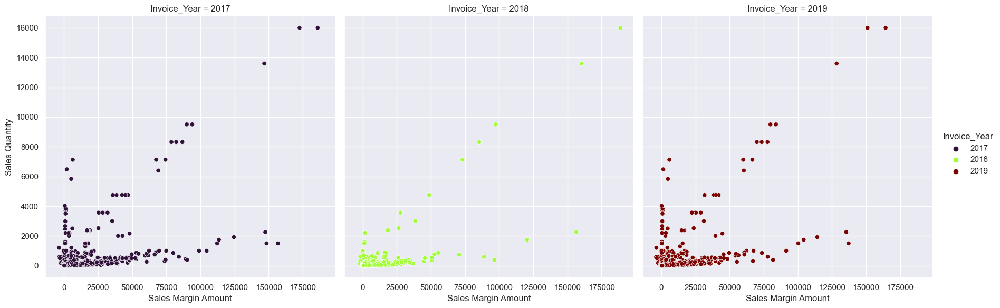

In [83]:
sns.relplot(y ='Sales Quantity',x = 'Sales Margin Amount', data=sales_data02, hue='Invoice_Year', col = 'Invoice_Year',height=6,
            palette='turbo')

*********************************************Yearly-Month wise Sales Margin Trend*********************************************


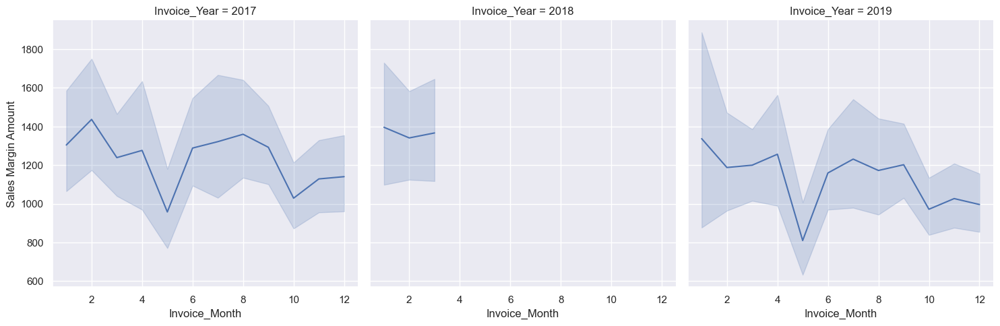

In [84]:
sns.relplot(x ='Invoice_Month',y = 'Sales Margin Amount', data= sales_data02 ,height=5,
            kind = 'line', aspect = 1, col = 'Invoice_Year')
plt.ylabel('Sales Margin Amount')
print('*'*45+'Yearly-Month wise Sales Margin Trend'+'*'*45)

****************************************Yearly-Month-wise Total Sales Margin Trend****************************************


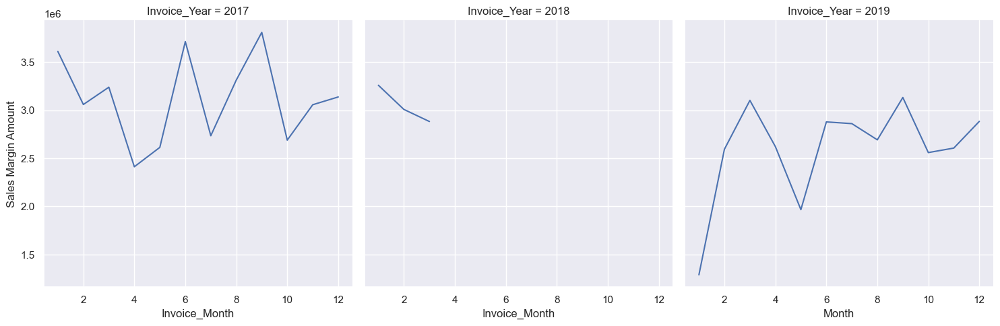

In [85]:
sns.relplot(x ='Invoice_Month',y = 'Sales Margin Amount', data=Yearly_Monthwise_Sales,height=5,
            kind = 'line', aspect = 1, col = 'Invoice_Year')
plt.xlabel('Month')
plt.ylabel('Sales Margin Amount')
print('*'*40+'Yearly-Month-wise Total Sales Margin Trend'+'*'*40)

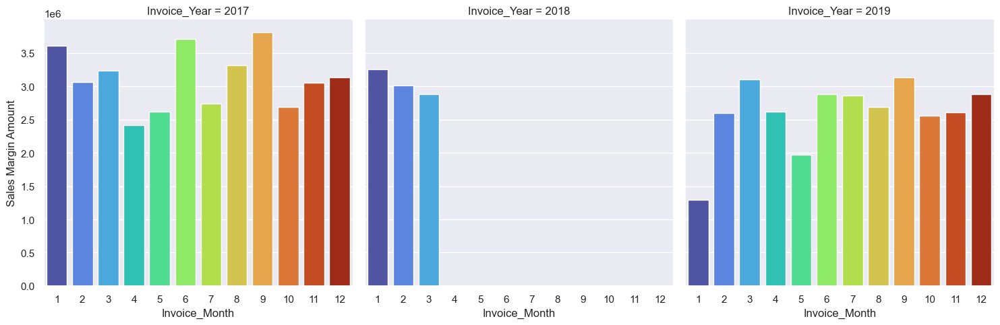

In [86]:
sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Month', data = Yearly_Monthwise_Sales, palette='turbo',kind="bar",
            col='Invoice_Year', col_wrap=3)

<Axes: xlabel='Sales Margin Amount', ylabel='Count'>

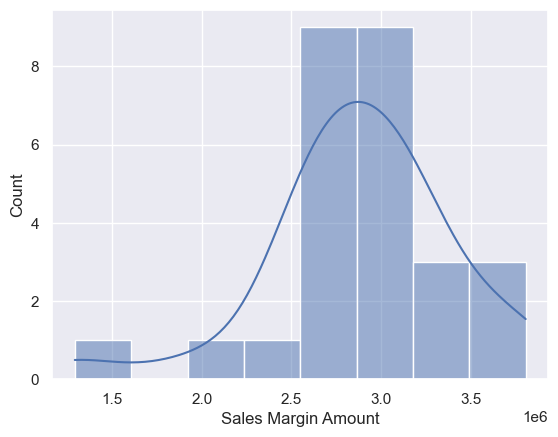

In [87]:
sns.histplot(Yearly_Monthwise_Sales['Sales Margin Amount'], kde = True)

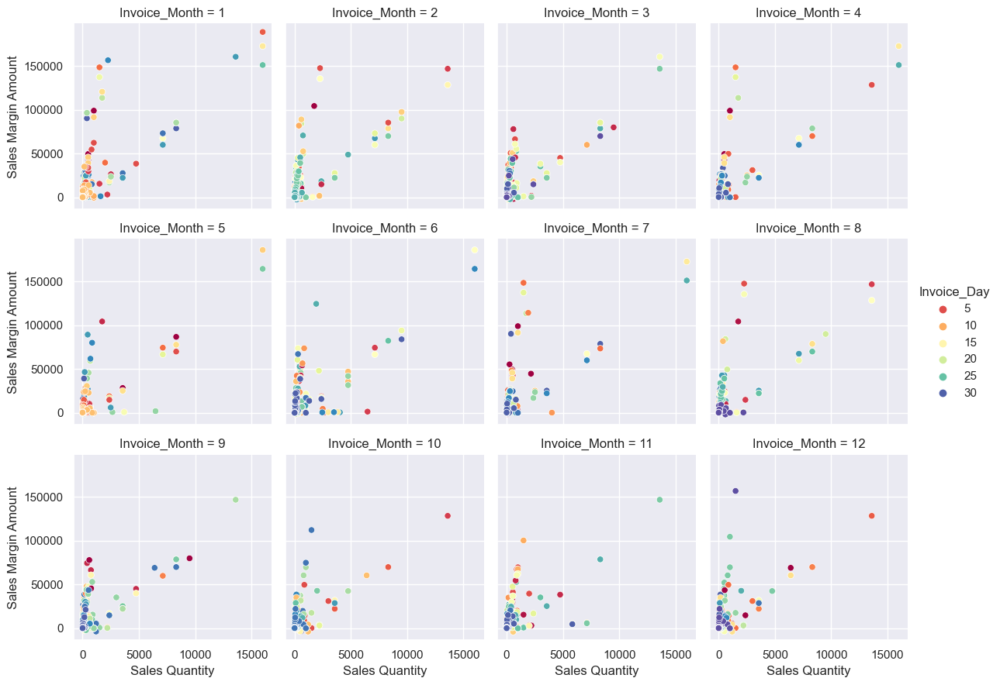

In [88]:
sns.relplot(x = 'Sales Quantity',
            y = 'Sales Margin Amount', data=sales_data02, height = 3,aspect=1,
            hue='Invoice_Day', col = 'Invoice_Month',col_wrap = 4, palette='Spectral')

****************************************Monthly Sales Margin Amount Trend in 2017****************************************


<Figure size 800x2000 with 0 Axes>

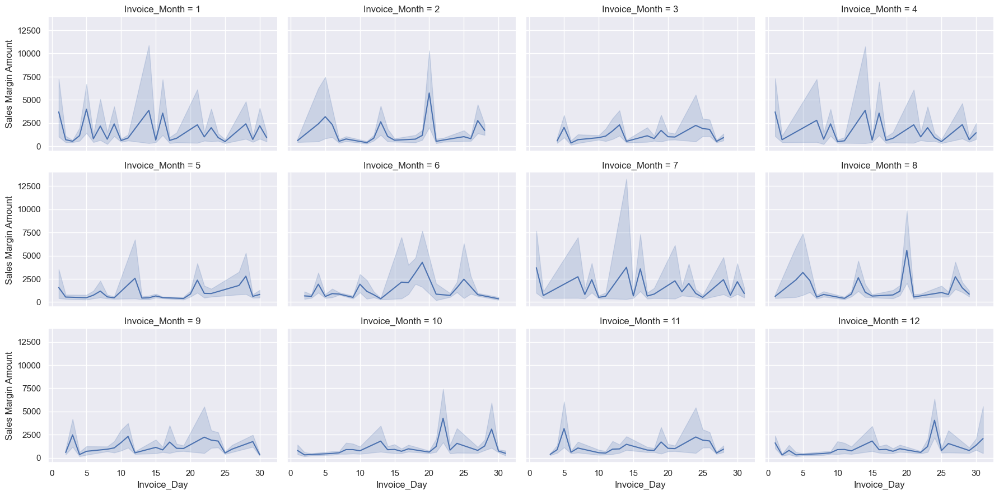

In [89]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Margin Amount', data= sales_data02.query('Invoice_Year == 2017'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*40+'Monthly Sales Margin Amount Trend in 2017'+'*'*40)

******************************************Monthly Sales Margin Amount Trend in 2018******************************************


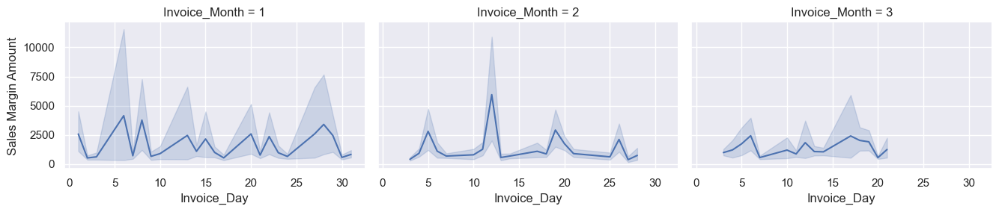

In [90]:
sns.relplot(x ='Invoice_Day',y = 'Sales Margin Amount', data= sales_data02.query('Invoice_Year == 2018'),
            kind = 'line', col = 'Invoice_Month', col_wrap = 3, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*42+'Monthly Sales Margin Amount Trend in 2018'+'*'*42)

****************************************Monthly Sales Margin Amount Trend in 2019****************************************


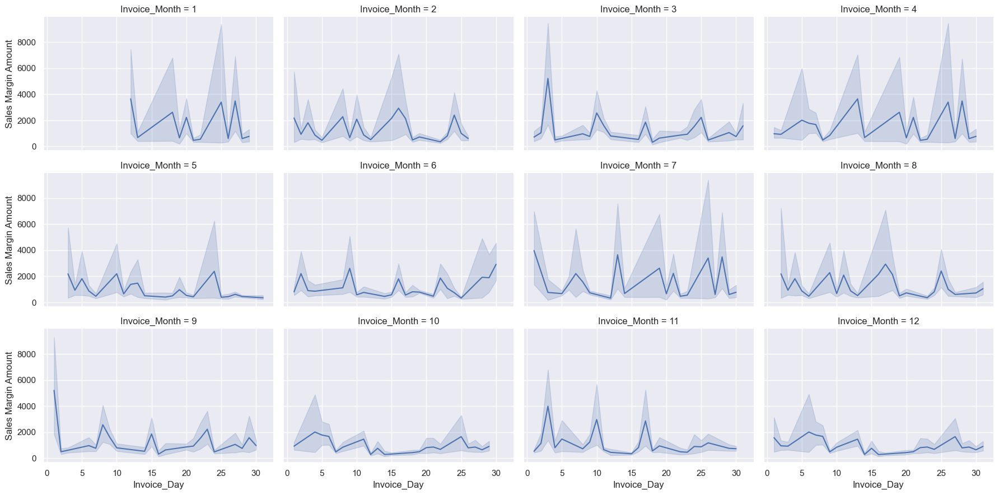

In [91]:
sns.relplot(x ='Invoice_Day',y = 'Sales Margin Amount', data= sales_data02.query('Invoice_Year == 2019'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*40+'Monthly Sales Margin Amount Trend in 2019'+'*'*40)

****************************************Daily Total Profits trend per month in 2017****************************************


<Figure size 800x2000 with 0 Axes>

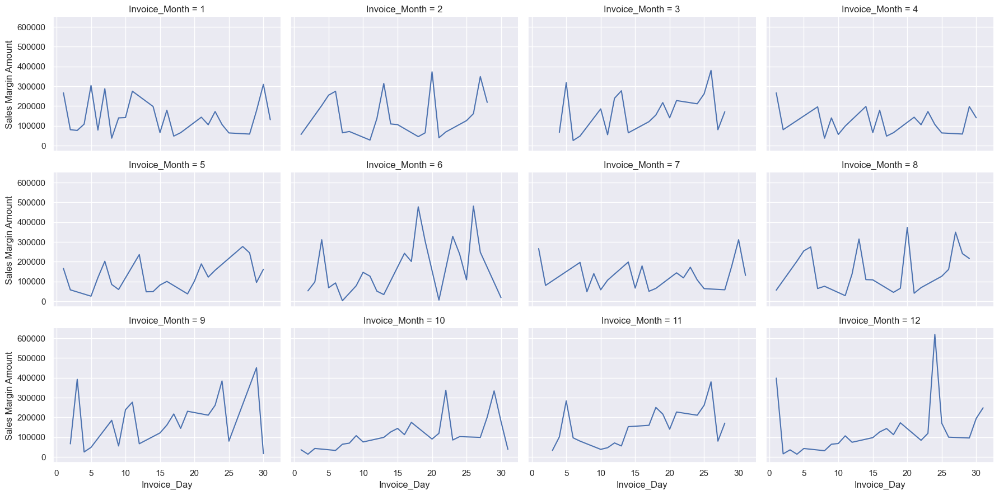

In [92]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Margin Amount', data= Monthly_sales.query('Invoice_Year == 2017'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*40+'Daily Total Profits trend per month in 2017'+'*'*40)

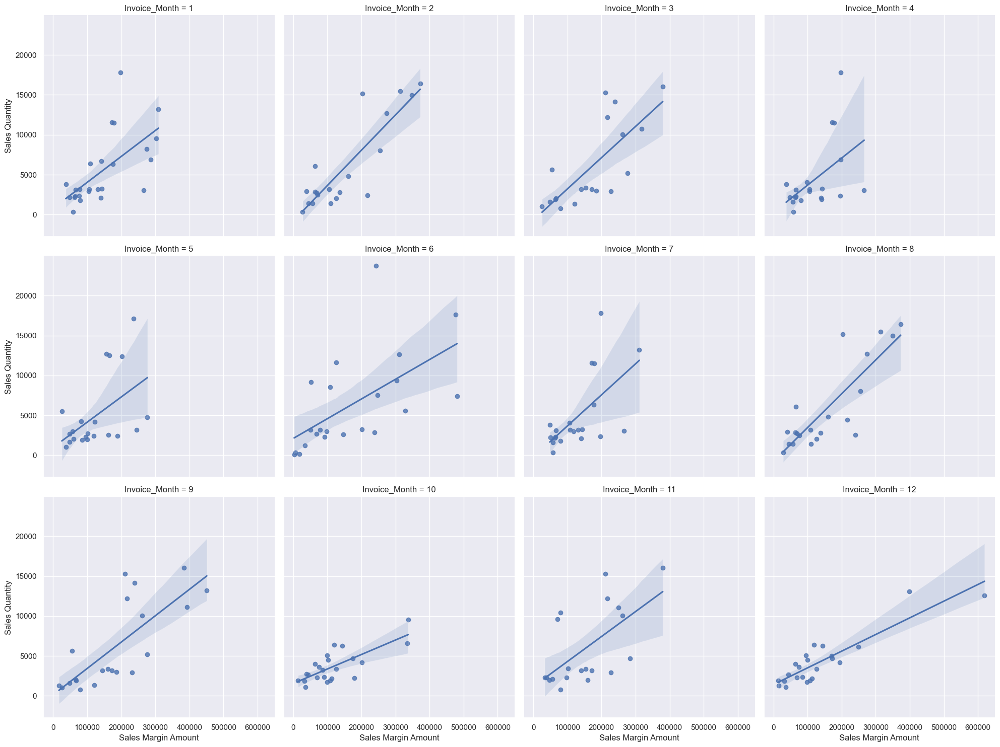

In [93]:
sns.lmplot(x='Sales Margin Amount',y = 'Sales Quantity', 
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2017], col='Invoice_Month', col_wrap=4)

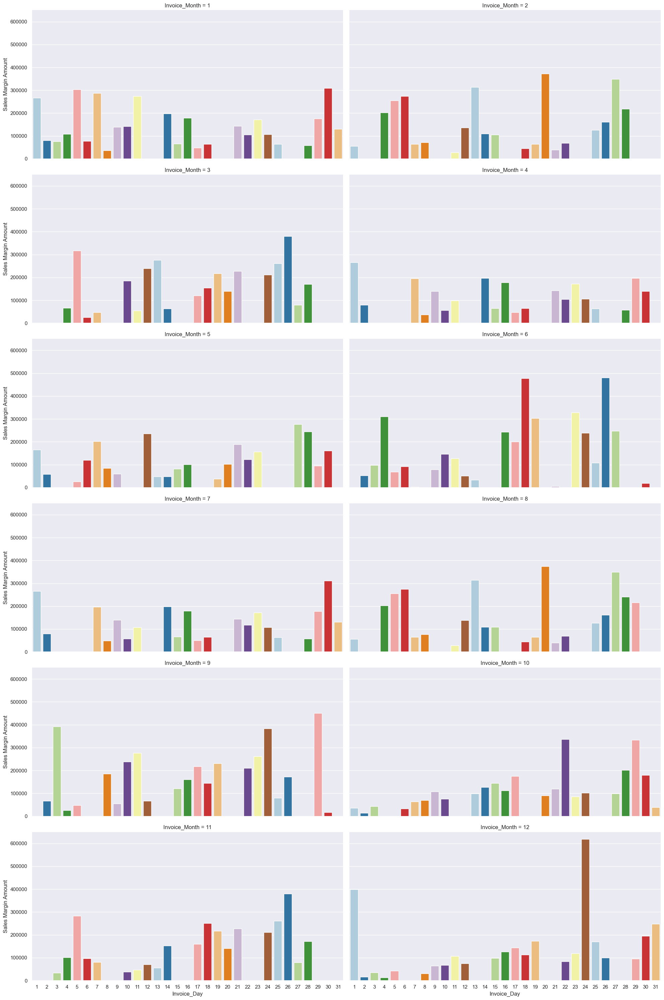

In [94]:
sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2017], aspect=2,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)

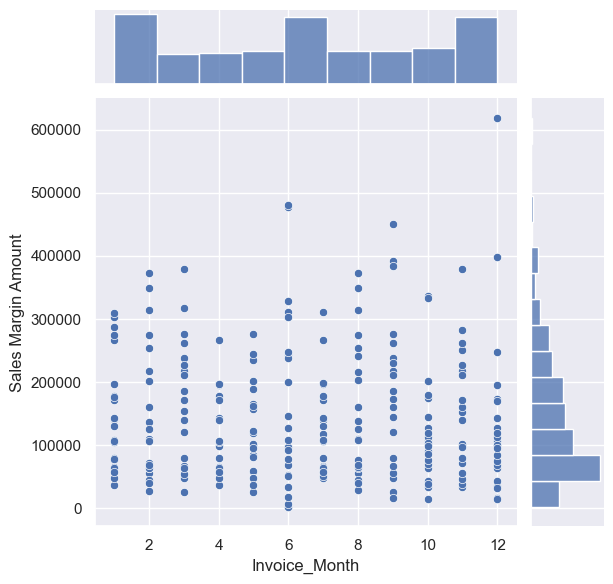

In [95]:
sns.jointplot(x = 'Invoice_Month', y='Sales Margin Amount', data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2017])

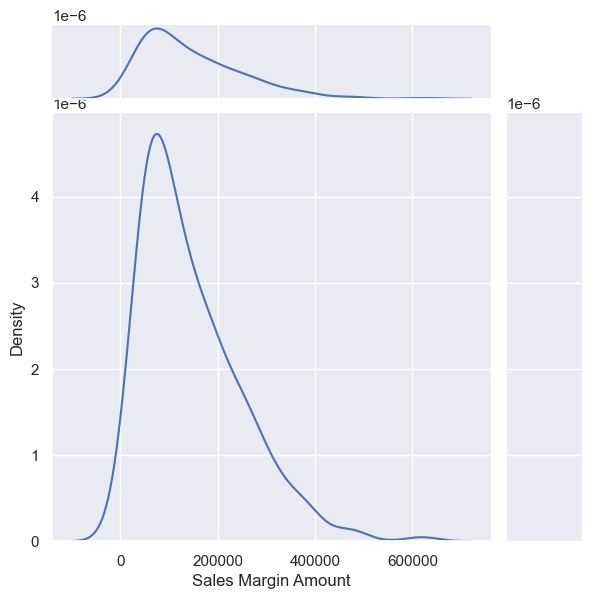

In [96]:
sns.jointplot(x='Sales Margin Amount',data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2017],ratio=5,kind='kde')

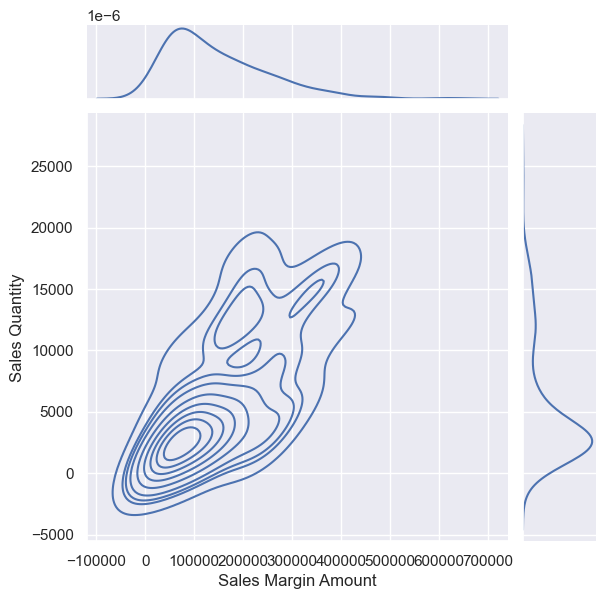

In [97]:
sns.jointplot(y = 'Sales Quantity', x='Sales Margin Amount',
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2017], kind='kde')

<Axes: xlabel='Sales Margin Amount', ylabel='Count'>

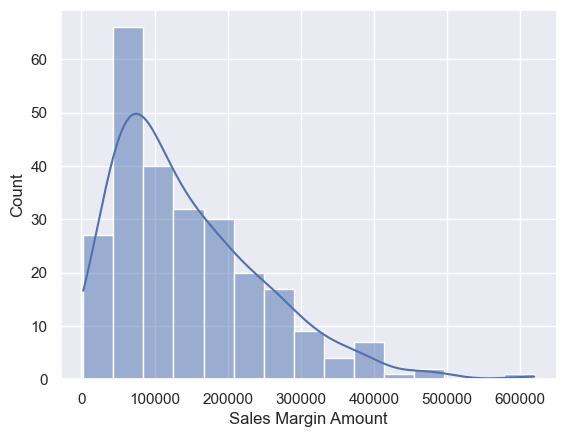

In [98]:
sns.histplot(Monthly_sales.query('Invoice_Year == 2017')['Sales Margin Amount'], kde = True)

****************************************Daily Total Profits per Month Trend in 2018****************************************


<Figure size 800x2000 with 0 Axes>

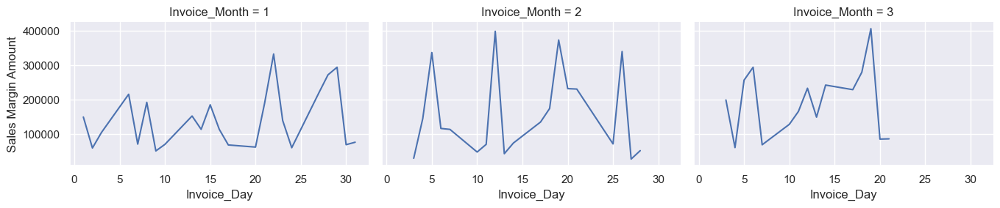

In [99]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Margin Amount', data= Monthly_sales.query('Invoice_Year == 2018'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*40+'Daily Total Profits per Month Trend in 2018'+'*'*40)


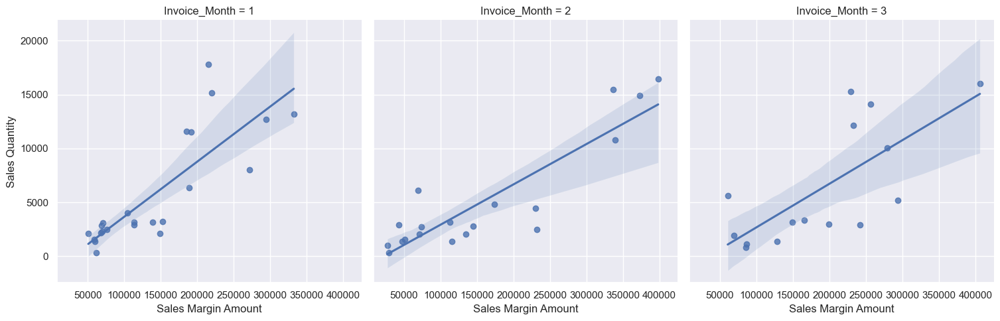

In [100]:
sns.lmplot(x='Sales Margin Amount',y = 'Sales Quantity', 
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2018], col='Invoice_Month', col_wrap=4)

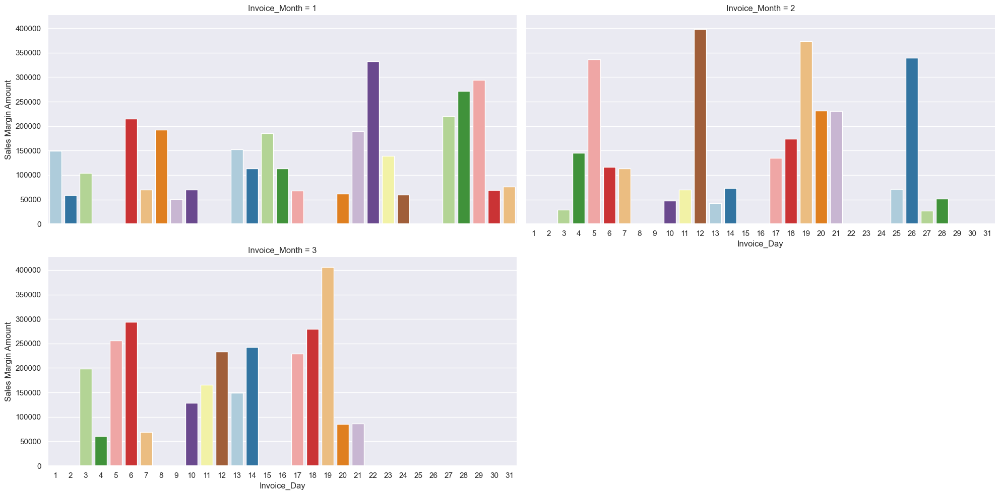

In [101]:
sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2018], aspect=2,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)

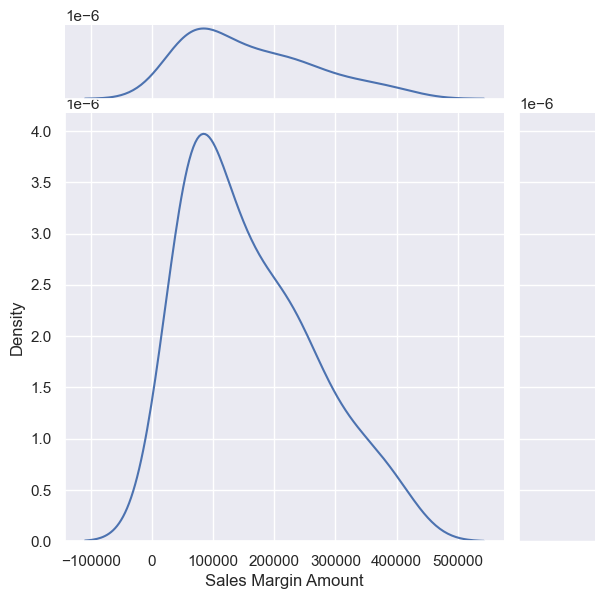

In [102]:
sns.jointplot(x='Sales Margin Amount',data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2018],ratio=5,kind='kde')

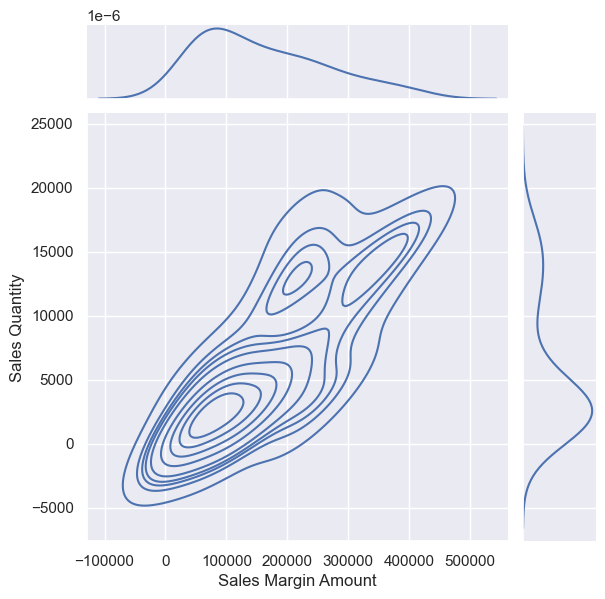

In [103]:
sns.jointplot(y = 'Sales Quantity', x='Sales Margin Amount',
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2018], kind='kde')

<Axes: xlabel='Sales Margin Amount', ylabel='Count'>

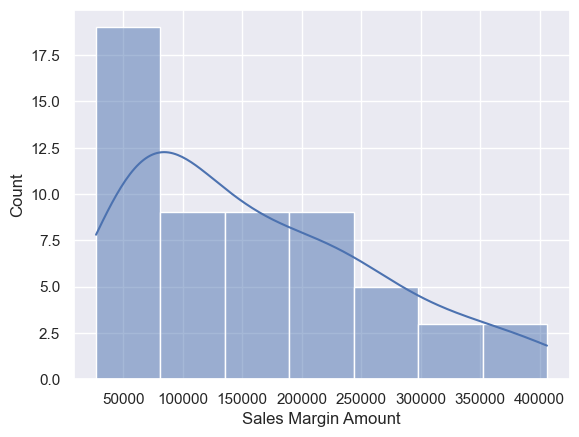

In [104]:
sns.histplot(Monthly_sales.query('Invoice_Year == 2018')['Sales Margin Amount'], kde = True)

****************************************Daily Total Profits Trend per Month in 2019****************************************


<Figure size 800x2000 with 0 Axes>

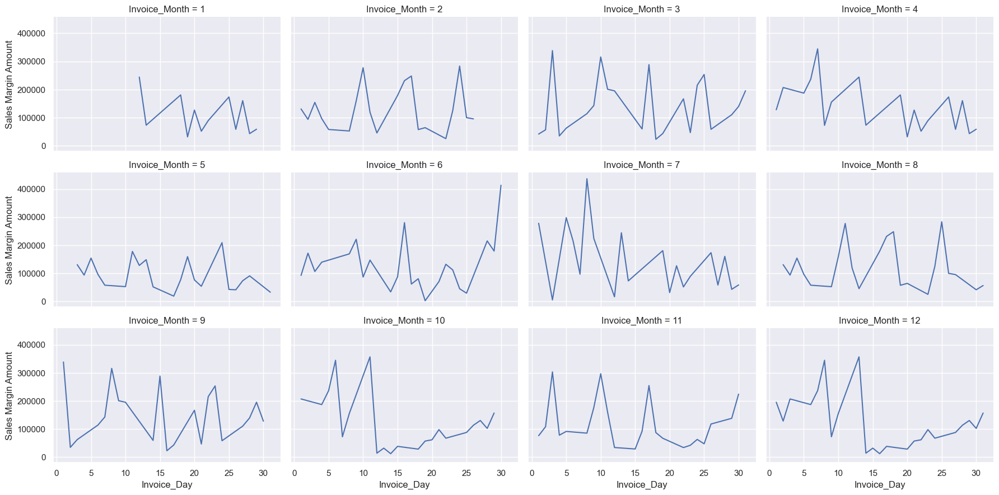

In [105]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Margin Amount', data= Monthly_sales.query('Invoice_Year == 2019'),
            kind = 'line', col = 'Invoice_Month', col_wrap =4, height = 3, aspect = 1.5)
plt.ylabel('Sales Amount')
print('*'*40+'Daily Total Profits Trend per Month in 2019'+'*'*40)

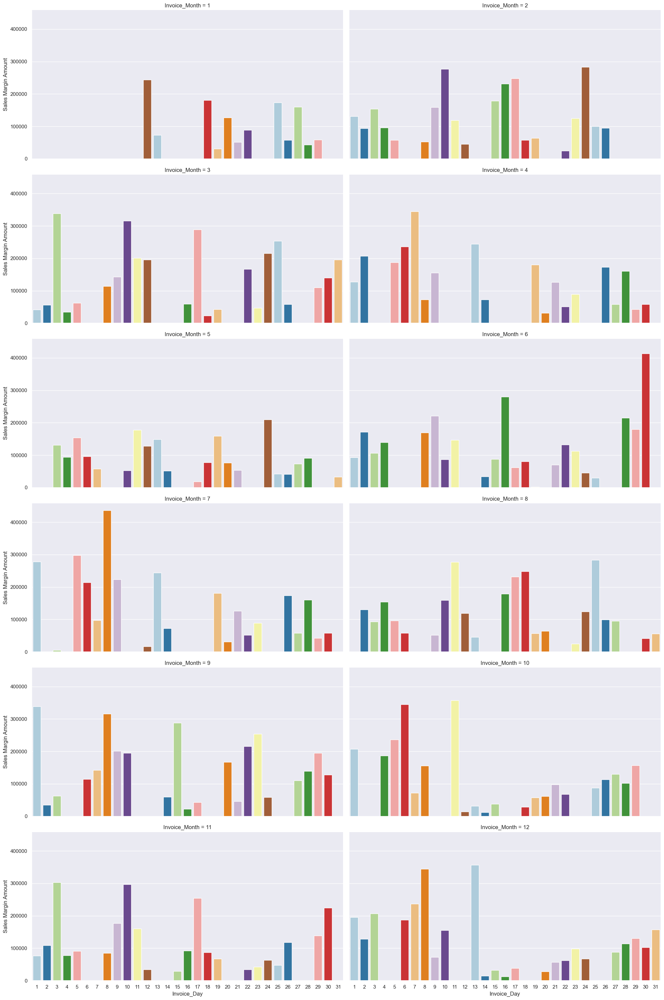

In [106]:
sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Day', data = Monthly_sales[Monthly_sales['Invoice_Year'] == 2019],
            aspect=2, palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)

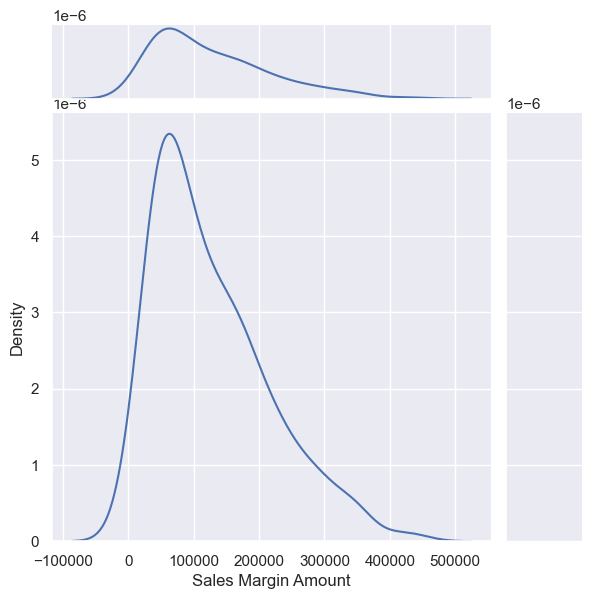

In [107]:
sns.jointplot(x='Sales Margin Amount',data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2019],ratio=5,kind='kde')

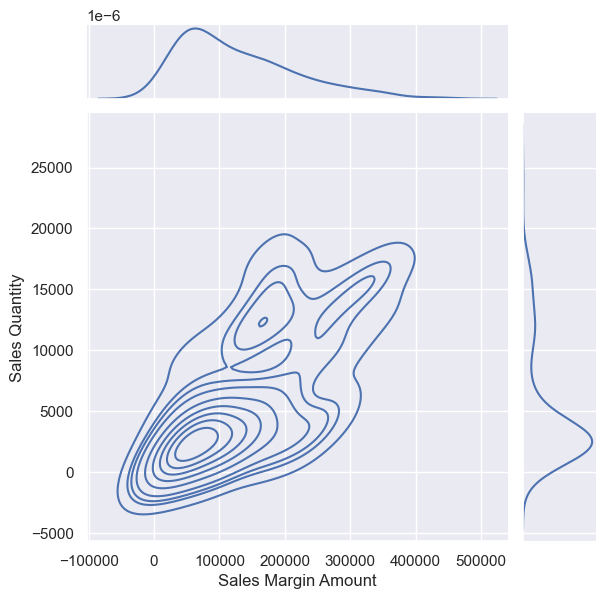

In [108]:
sns.jointplot(y = 'Sales Quantity', x='Sales Margin Amount',
              data=Monthly_sales[Monthly_sales["Invoice_Year"] ==2019], kind='kde')

<Axes: xlabel='Sales Margin Amount', ylabel='Count'>

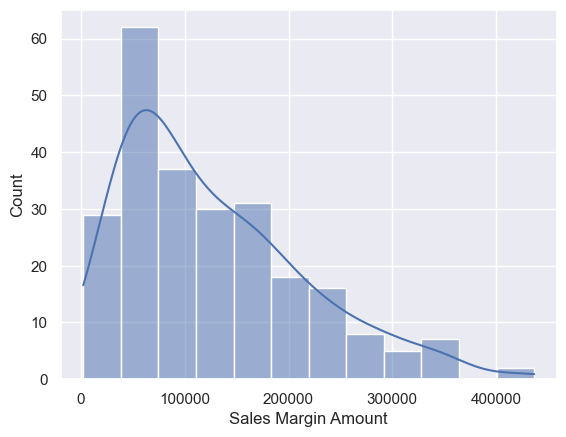

In [109]:
sns.histplot(Monthly_sales.query('Invoice_Year == 2019')['Sales Margin Amount'], kde = True)

In [117]:
Top10byCustkey17 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2017].groupby(['Invoice_Year','Custkey']).sum()
Top10byCustkey17 = Top10byCustkey17.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\1041194863.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Top10byCustkey17 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2017].groupby(['Invoice_Year','Custkey']).sum()


,Custkey,Sales Margin Amount
0,10021485,5176926.16
1,10025024,3250809.87
2,10025052,1761731.21
3,10025919,1415771.68
4,10025241,1267256.40
5,10023023,870216.36
6,10020184,843138.90
7,10009606,835041.55
8,10012715,782863.50
9,10023715,729615.06


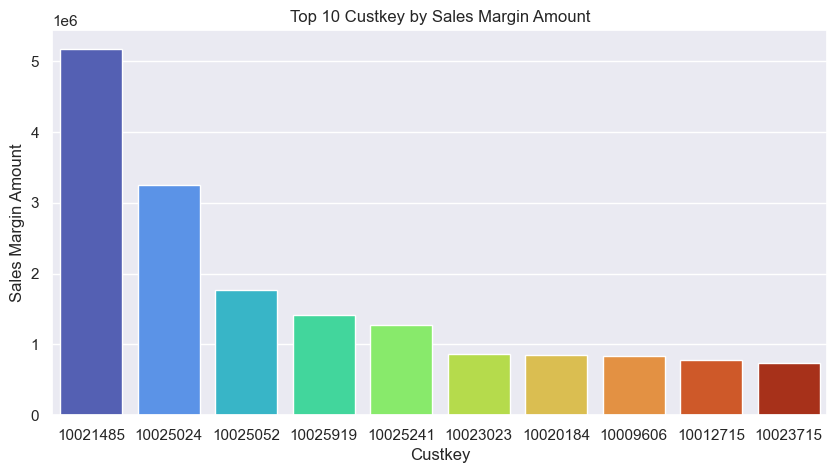

In [118]:
plt.figure(figsize=(10,5))
sns.barplot(x='Custkey', y='Sales Margin Amount',data = Top10byCustkey17, palette = 'turbo',
            order = Top10byCustkey17.Custkey)
plt.title('Top 10 Custkey by Sales Margin Amount')
Top10byCustkey17[['Custkey', 'Sales Margin Amount']]

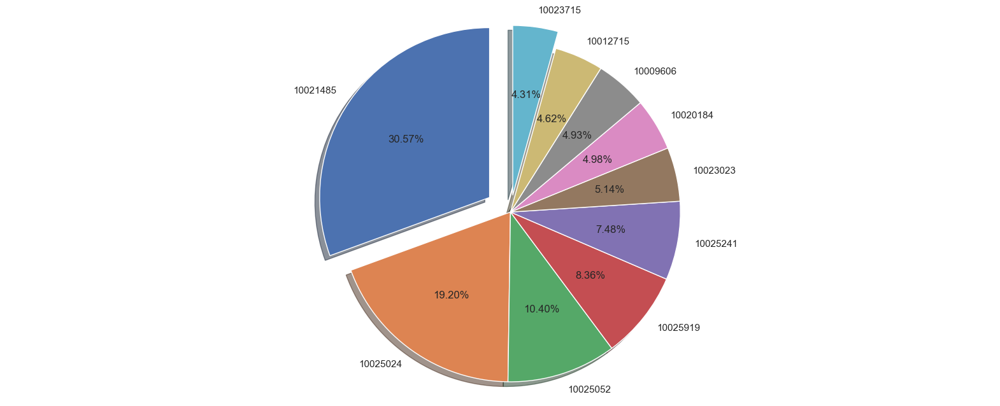

In [120]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='Custkey',data=Top10byCustkey17,
        autopct='%1.2f%%',shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.show()

In [121]:
Top10byCustkey18 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2018].groupby(['Invoice_Year','Custkey']).sum()
Top10byCustkey18 = Top10byCustkey18.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\530394506.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Top10byCustkey18 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2018].groupby(['Invoice_Year','Custkey']).sum()


,Custkey,Sales Margin Amount
0,10025039,1398188.29
1,10002154,1154085.14
2,10006919,509760.00
3,10025552,332110.69
4,10017638,233470.15
5,10019066,207997.56
6,10026299,195547.06
7,10023471,195034.39
8,10007183,162898.91
9,10010935,152253.65


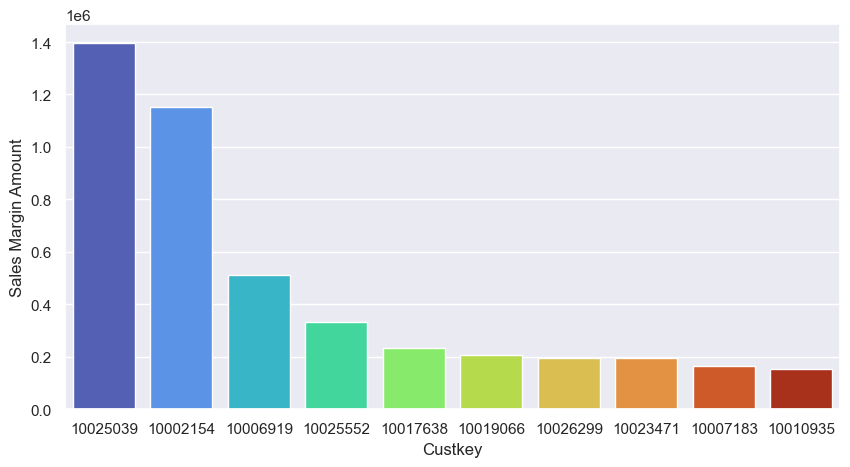

In [123]:
plt.figure(figsize=(10,5))
sns.barplot(x='Custkey', y='Sales Margin Amount',data = Top10byCustkey18, palette = 'turbo',
            order = Top10byCustkey18.Custkey)
Top10byCustkey18[['Custkey', 'Sales Margin Amount']]

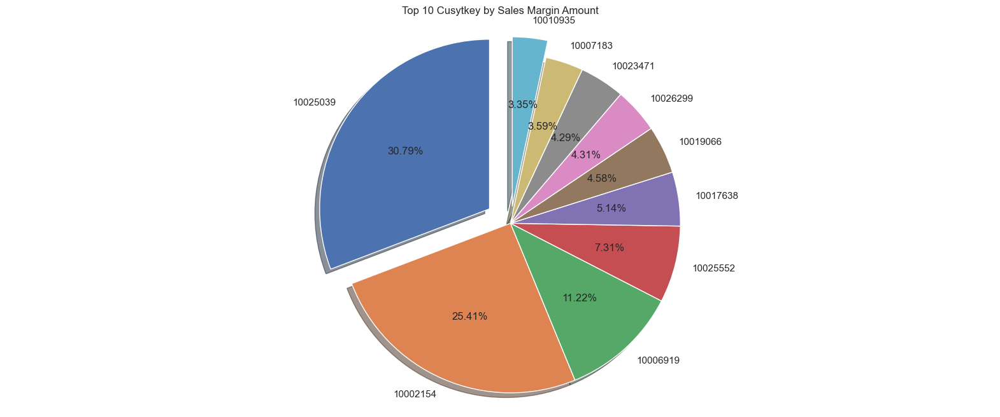

In [124]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='Custkey',data=Top10byCustkey18,autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 Cusytkey by Sales Margin Amount')
plt.show()

In [125]:
Top10byCustkey19 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2019].groupby(['Invoice_Year','Custkey']).sum()
Top10byCustkey19 = Top10byCustkey19.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\1696385640.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Top10byCustkey19 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2019].groupby(['Invoice_Year','Custkey']).sum()


,Custkey,Sales Margin Amount
0,10009676,4473954.12
1,10021300,2840289.66
2,10025737,1544679.20
3,10019194,1221320.93
4,10025353,1114700.90
5,10025571,798919.82
6,10026606,712503.86
7,10012226,702720.45
8,10016548,683579.49
9,10004245,619735.78


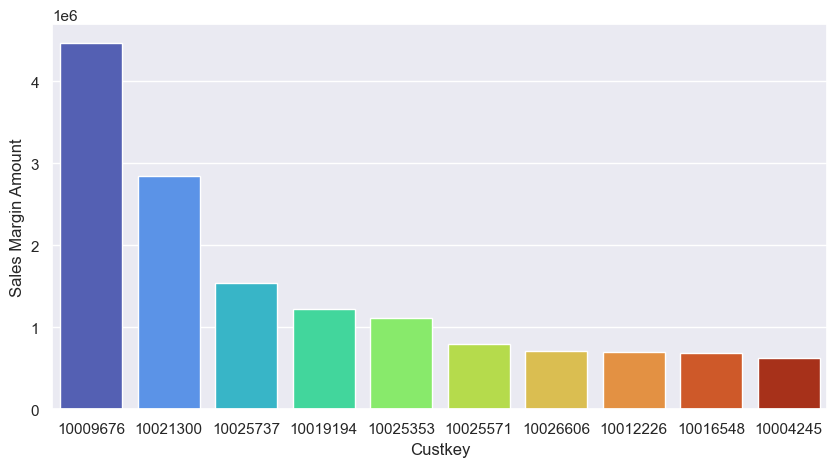

In [126]:
plt.figure(figsize=(10,5))
sns.barplot(x='Custkey', y='Sales Margin Amount',data = Top10byCustkey19, palette = 'turbo',
            order = Top10byCustkey19.Custkey)
Top10byCustkey19[['Custkey', 'Sales Margin Amount']]

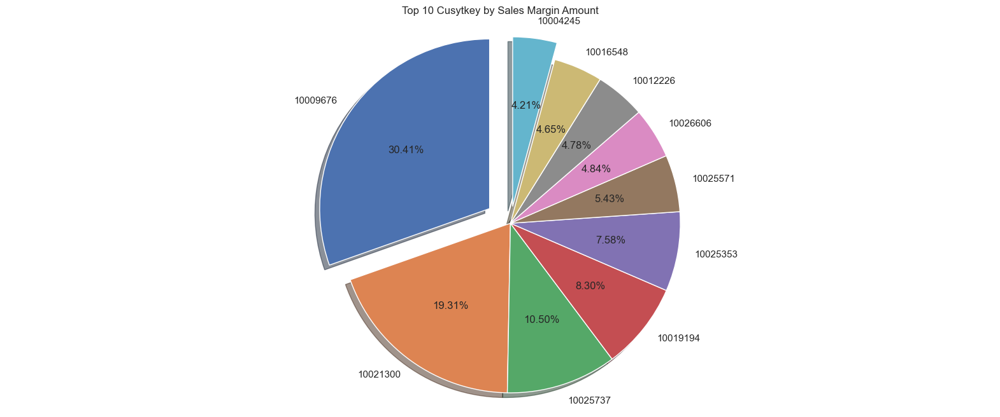

In [127]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='Custkey',data=Top10byCustkey19,autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 Cusytkey by Sales Margin Amount')
plt.show()

In [128]:
High_Profit = sales_data01.groupby('Item').sum().sort_values('Sales Margin Amount', ascending=False).reset_index()
High_Profit.index+=1
High_Profit=High_Profit.reset_index().rename(columns={"index":"Rank"})

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\554588705.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  High_Profit = sales_data01.groupby('Item').sum().sort_values('Sales Margin Amount', ascending=False).reset_index()


,Rank,Item,Sales Margin Amount
0,1,Better Large Canned Shrimp,5459826.26
1,2,High Top Dried Mushrooms,4659100.16
2,3,Big Time Frozen Cheese Pizza,2826772.99
3,4,Fast Mini Donuts,2663325.66
4,5,Discover Manicotti,2381667.84
5,6,Ebony Squash,2336246.16
6,7,Better Fancy Canned Sardines,2131933.94
7,8,Landslide White Sugar,2079755.46
8,9,Tell Tale Red Delcious Apples,1977923.42
9,10,Better Canned Tuna in Oil,1903351.46


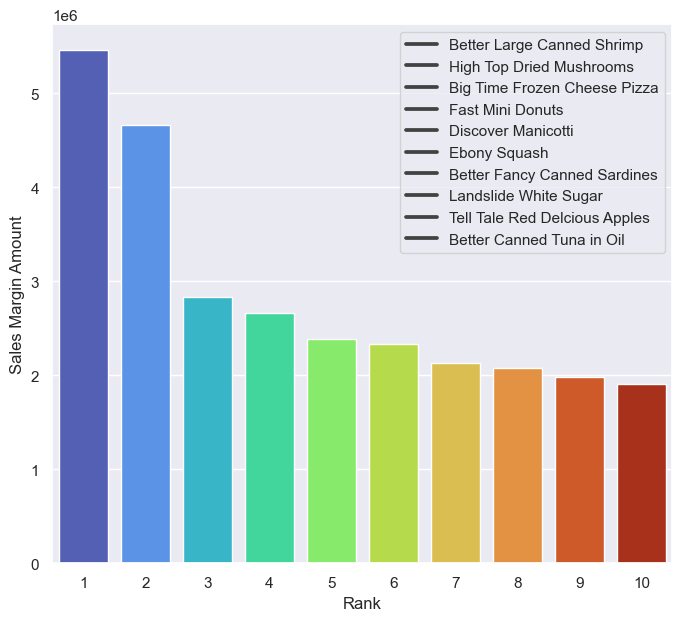

In [129]:
plt.figure(figsize=(8,7))
sns.barplot(x='Rank', y='Sales Margin Amount',data = High_Profit.head(10), palette = 'turbo')
plt.legend(High_Profit['Item'].head(10))
High_Profit[['Rank', 'Item', 'Sales Margin Amount']].head(10)

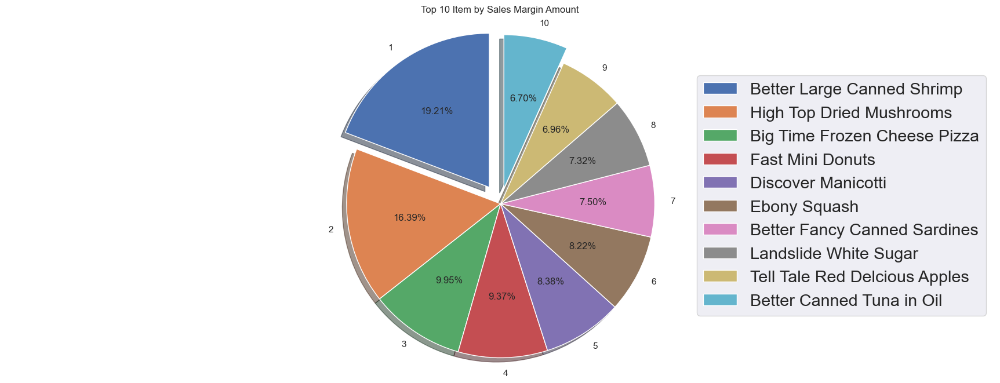

In [130]:
plt.figure(figsize=(22,8))
plt.pie('Sales Margin Amount',labels='Rank',data=High_Profit.head(10),autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.13, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 Item by Sales Margin Amount')
plt.legend(High_Profit['Item'].head(10), loc=7, fontsize = 'xx-large')
plt.show()

In [131]:
High_Sales = sales_data01.groupby('Item').sum().sort_values('Sales Amount', ascending=False).reset_index()
High_Sales.index+=1
High_Sales=High_Sales.reset_index().rename(columns={"index":"Rank"})

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\3473351079.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  High_Sales = sales_data01.groupby('Item').sum().sort_values('Sales Amount', ascending=False).reset_index()


,Rank,Item,Sales Amount
0,1,Better Large Canned Shrimp,15454172.47
1,2,High Top Dried Mushrooms,13367714.53
2,3,Red Spade Pimento Loaf,5711486.45
3,4,Better Canned Tuna in Oil,5693075.12
4,5,Ebony Squash,5380727.75
5,6,Big Time Frozen Cheese Pizza,5127171.17
6,7,Fast Mini Donuts,5009499.08
7,8,Better Fancy Canned Sardines,4975348.35
8,9,Discover Manicotti,4901139.48
9,10,Landslide White Sugar,4282290.62


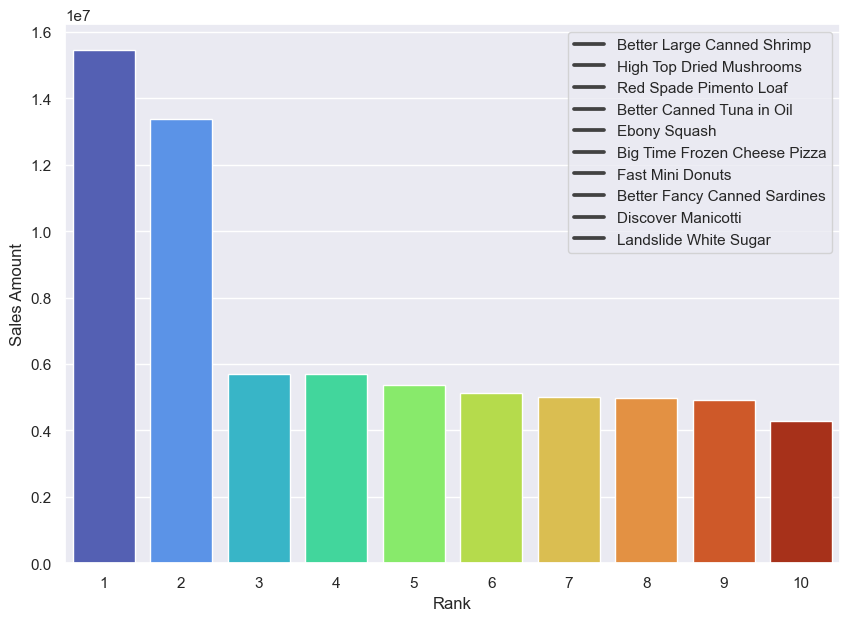

In [132]:
plt.figure(figsize=(10,7))
sns.barplot(x='Rank', y='Sales Amount',data = High_Sales.head(10), palette = 'turbo')
plt.legend(High_Sales['Item'].head(10))
High_Sales[['Rank', 'Item', 'Sales Amount']].head(10)

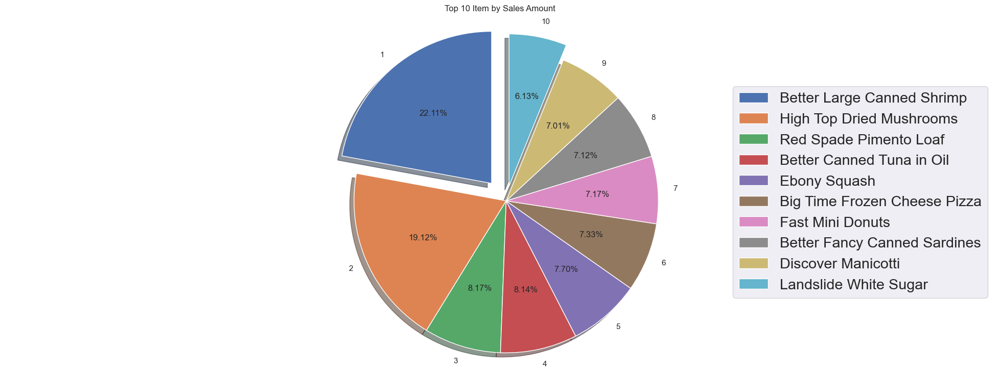

In [133]:
plt.figure(figsize=(25,9))
plt.pie('Sales Amount',labels='Rank',data=High_Sales.head(10),autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 Item by Sales Amount')
plt.legend(High_Sales['Item'].head(10), loc=7, fontsize = 'xx-large')
plt.show()

In [134]:
High_SalesPrice = sales_data01.groupby('Item').sum().sort_values('Sales Price', ascending=False).reset_index()
High_SalesPrice.index+=1
High_SalesPrice=High_SalesPrice.reset_index().rename(columns={"index":"Rank"})

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\872068592.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  High_SalesPrice = sales_data01.groupby('Item').sum().sort_values('Sales Price', ascending=False).reset_index()


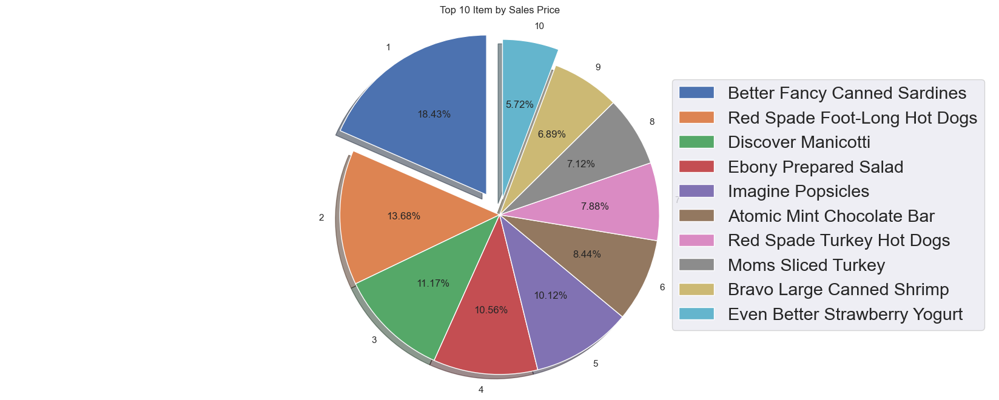

In [135]:
plt.figure(figsize=(21
                    ,8))
plt.pie('Sales Price',labels='Rank',data=High_SalesPrice.head(10),autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 Item by Sales Price')
plt.legend(High_SalesPrice['Item'].head(10), loc=7, fontsize = 'xx-large')
plt.show()

In [136]:
High_CostAmount = sales_data01.groupby('Item').sum().sort_values('Sales Cost Amount', ascending=False).reset_index()
High_CostAmount.index+=1
High_CostAmount=High_CostAmount.reset_index().rename(columns={"index":"Rank"})

C:\Users\hrsps\AppData\Local\Temp\ipykernel_15988\2122541115.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  High_CostAmount = sales_data01.groupby('Item').sum().sort_values('Sales Cost Amount', ascending=False).reset_index()


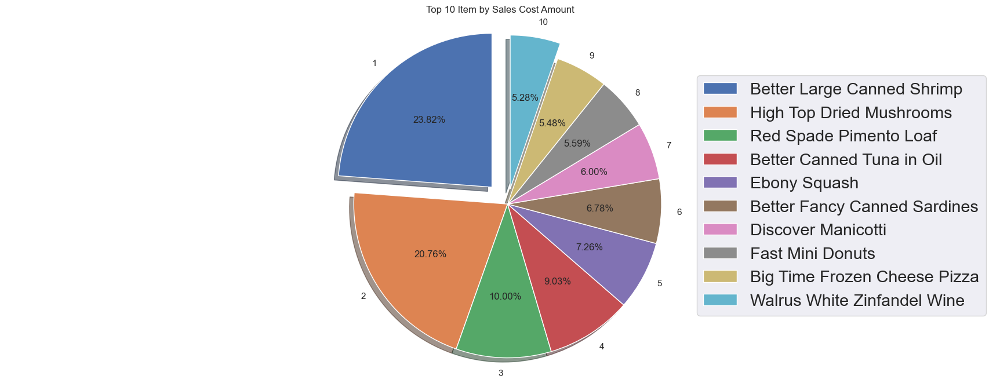

In [137]:
plt.figure(figsize=(22,8))
plt.pie('Sales Cost Amount',labels='Rank',data=High_CostAmount.head(10),autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 Item by Sales Cost Amount')
plt.legend(High_CostAmount['Item'].head(10), loc=7, fontsize = 'xx-large')
plt.show()

Text(0, 0.5, 'Sales Quantity')

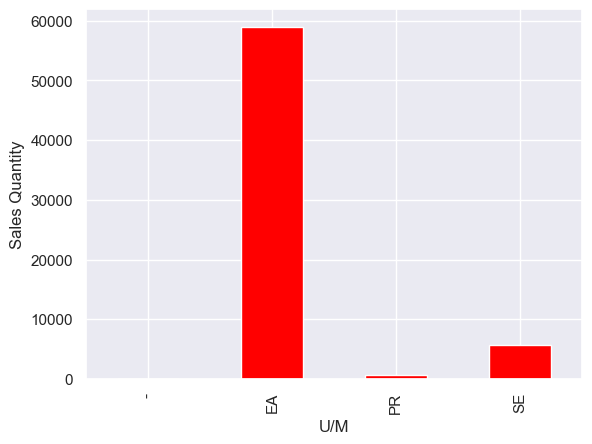

In [138]:
sales_data01.groupby('U/M')['Sales Quantity'].count().plot(kind='bar',color='Red')
plt.ylabel('Sales Quantity')

Text(0, 0.5, 'Sales Quantity')

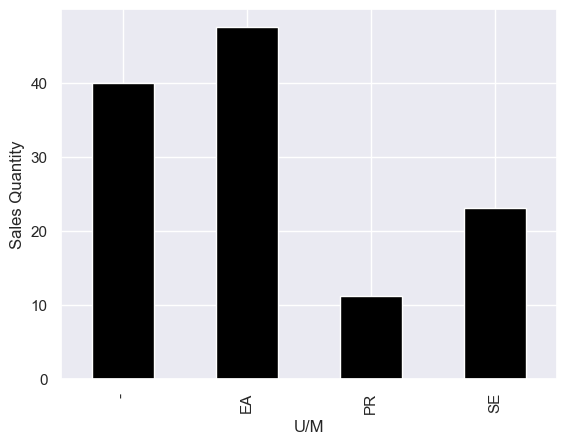

In [139]:
sales_data01.groupby('U/M')['Sales Quantity'].mean().plot(kind='bar',color='black')
plt.ylabel('Sales Quantity')

Text(0, 0.5, 'Sales Price')

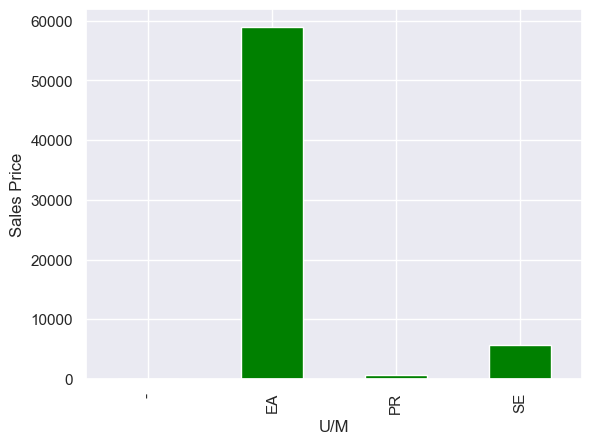

In [140]:
sales_data01.groupby('U/M')['Sales Price'].count().plot(kind='bar',color='green')
plt.ylabel('Sales Price')

Text(0, 0.5, 'Sales Price')

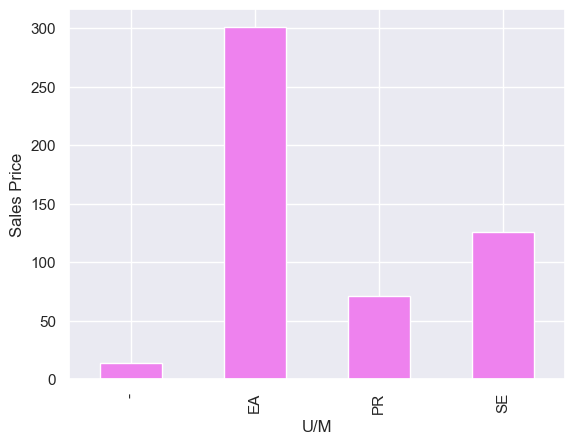

In [141]:
sales_data.groupby('U/M')['Sales Price'].mean().plot(kind='bar',color='violet')
plt.ylabel('Sales Price')

Text(0, 0.5, 'Sales Amount')

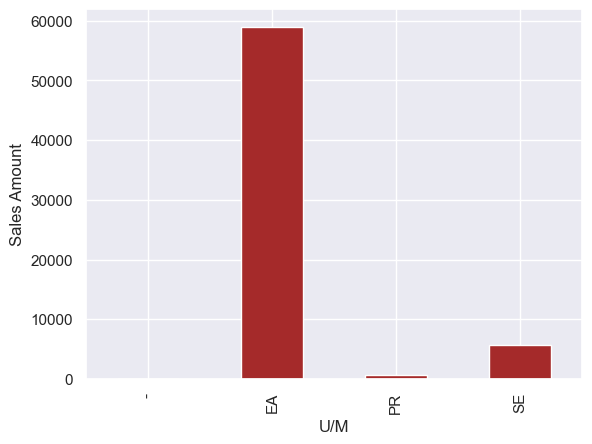

In [142]:
sales_data01.groupby('U/M')['Sales Amount'].count().plot(kind='bar',color='brown')
plt.ylabel('Sales Amount')

Text(0, 0.5, 'Sales Amount')

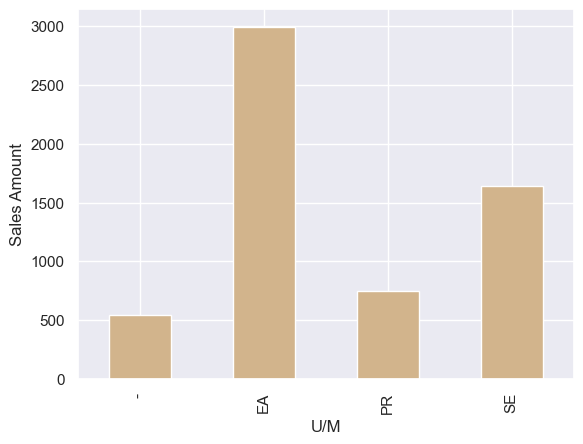

In [143]:
sales_data01.groupby('U/M')['Sales Amount'].mean().plot(kind='bar',color='tan')
plt.ylabel('Sales Amount')

Text(0, 0.5, 'Sales Margin Amount')

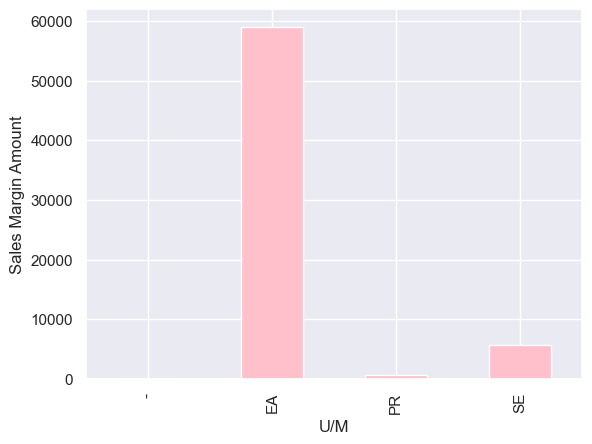

In [144]:
sales_data.groupby('U/M')['Sales Margin Amount'].count().plot(kind='bar',color='pink')
plt.ylabel('Sales Margin Amount')

Text(0, 0.5, 'Sales Margin Amount')

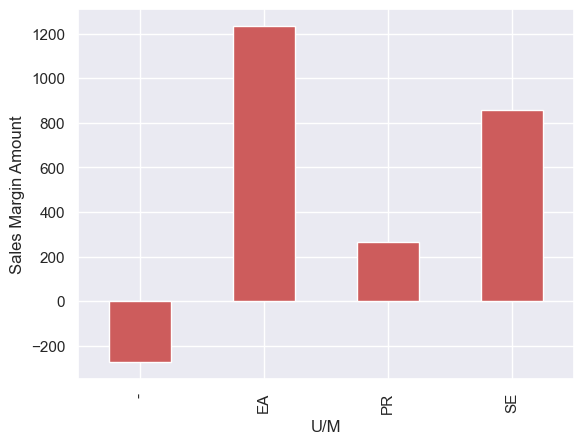

In [145]:
sales_data.groupby('U/M')['Sales Margin Amount'].mean().plot(kind='bar',color='indianred')
plt.ylabel('Sales Margin Amount')

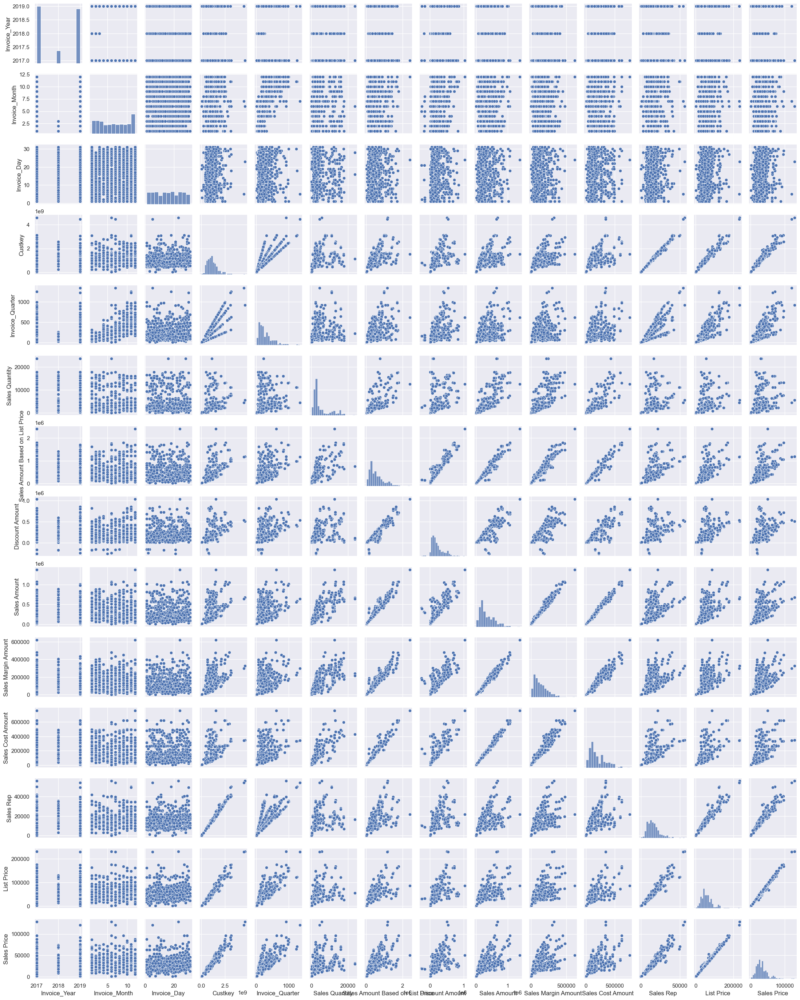

In [149]:
sns.pairplot(Monthly_sales, height = 2, aspect = 0.8)